In [7]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
from scipy import sparse
from sklearn.metrics import precision_score, recall_score, confusion_matrix, accuracy_score
from xgboost import XGBRegressor as XGBR
import matplotlib.pyplot as plt
sc.settings.verbosity = 3 # verbosity 的取值表示测试结果显示的详细程度，数字越大越详细
sc.settings.set_figure_params(dpi=80) # set_figure_params 设置图片的分辨率/大小以及其他样式

In [2]:
param_dist = {'objective':'binary:logistic', 
              'n_estimators':100}
reg = XGBR(**param_dist)
reg.load_model('./model/sc_xgboost_alldata.model')
# reg.load_model('./model/sc_xgboost_0408.model')

## An example of Read_10X

In [25]:
data = sc.read_10x_mtx('./SingleCell/20200208-PAC-CRR034496-T1-Tumor/filtered_feature_bc_matrix', var_names='gene_symbols', cache=False)
cellAnn = pd.read_csv('./SingleCell/20200208-PAC-CRR034496-T1-Tumor/cellAnnotation.txt', delim_whitespace=True, 
                      usecols=['barcodes','UMAP_1', 'UMAP_2', 'Malign.type'], index_col=['barcodes'])

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [26]:
data

AnnData object with n_obs × n_vars = 2538 × 32738
    var: 'gene_ids', 'feature_types'

In [39]:
data[cellAnn.index + '-1',]

View of AnnData object with n_obs × n_vars = 1939 × 32738
    var: 'gene_ids', 'feature_types'

In [36]:
cell = data.obs_names.to_list()
cell

['AAACCTGAGATGTCGG-1',
 'AAACCTGCAAGACGTG-1',
 'AAACCTGGTAGGGACT-1',
 'AAACCTGTCCGGGTGT-1',
 'AAACCTGTCTTCATGT-1',
 'AAACGGGGTCATGCAT-1',
 'AAACGGGTCTATCCTA-1',
 'AAAGATGAGGCATTGG-1',
 'AAAGATGAGTGGTCCC-1',
 'AAAGATGCATCGGAAG-1',
 'AAAGATGCATGTTGAC-1',
 'AAAGATGGTCGAGTTT-1',
 'AAAGATGGTCTCTCTG-1',
 'AAAGATGTCTTTACAC-1',
 'AAAGCAAAGGTGCTAG-1',
 'AAAGCAAAGTGTACCT-1',
 'AAAGCAACATTGAGCT-1',
 'AAAGCAAGTGCAGGTA-1',
 'AAAGCAAGTGTTCGAT-1',
 'AAAGCAATCACTATTC-1',
 'AAAGCAATCACTTCAT-1',
 'AAAGTAGAGAATGTTG-1',
 'AAAGTAGAGTCGTACT-1',
 'AAAGTAGCATTACGAC-1',
 'AAAGTAGCATTGGTAC-1',
 'AAAGTAGTCAACGGGA-1',
 'AAAGTAGTCTAACTGG-1',
 'AAATGCCAGAAACGCC-1',
 'AAATGCCGTATAGTAG-1',
 'AAATGCCGTCTAGTGT-1',
 'AAATGCCTCTATGTGG-1',
 'AACACGTAGAAGGTGA-1',
 'AACACGTCAATGACCT-1',
 'AACACGTCACACAGAG-1',
 'AACACGTCATGCATGT-1',
 'AACACGTGTCATATCG-1',
 'AACACGTGTGCTGTAT-1',
 'AACACGTTCATTATCC-1',
 'AACACGTTCCATGAGT-1',
 'AACCATGCACAACTGT-1',
 'AACCATGTCCTGTAGA-1',
 'AACCATGTCTGATTCT-1',
 'AACCATGTCTGTCCGT-1',
 'AACCGCGCA

In [37]:
cellAnn.index + '-1'

Index(['AAACCTGCAAGACGTG-1', 'AAACCTGGTAGGGACT-1', 'AAACCTGTCCGGGTGT-1',
       'AAACCTGTCTTCATGT-1', 'AAACGGGGTCATGCAT-1', 'AAACGGGTCTATCCTA-1',
       'AAAGATGAGGCATTGG-1', 'AAAGATGAGTGGTCCC-1', 'AAAGATGCATCGGAAG-1',
       'AAAGATGCATGTTGAC-1',
       ...
       'TTTGCGCCAGTCCTTC-1', 'TTTGCGCGTGATAAAC-1', 'TTTGCGCTCGGCTACG-1',
       'TTTGGTTAGTGGGTTG-1', 'TTTGGTTCAAATACAG-1', 'TTTGGTTGTTTGGCGC-1',
       'TTTGGTTTCATCGCTC-1', 'TTTGTCAAGGGTTCCC-1', 'TTTGTCATCCTTTCGG-1',
       'TTTGTCATCTAAGCCA-1'],
      dtype='object', name='barcodes', length=1939)

# H5ad file

## Load model and read data

In [16]:
param_dist = {'objective':'binary:logistic', 
              'n_estimators':100}
reg = XGBR(**param_dist)
reg.load_model('./model/sc_xgboost_alldata.model')
data = sc.read_h5ad('/home/glab/liver_atlas/normal_atlas/data/Gu2022_43878.h5ad')
# data = sc.read_h5ad('/home/glab/liver_atlas/Ma2021/Ma2021_43878.h5ad')
data
data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
# sc.pp.filter_cells(data, min_genes=200)
sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
mito_genes = data.var_names.str.startswith('MT-')
data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
data.obs['n_counts'] = data.X.sum(axis=1).A1
# 标准化:TPM
sc.pp.normalize_total(data, target_sum=1e4)
sc.pp.log1p(data)
print(data.X)

filtered out 24488 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
  (0, 16)	1.3521177395837898
  (0, 17)	1.9067543874653816
  (0, 18)	1.3521177395837898
  (0, 25)	1.3521177395837898
  (0, 32)	1.3521177395837898
  (0, 45)	1.3521177395837898
  (0, 49)	1.3521177395837898
  (0, 58)	1.3521177395837898
  (0, 88)	1.3521177395837898
  (0, 91)	1.3521177395837898
  (0, 107)	2.2614307128676048
  (0, 130)	1.3521177395837898
  (0, 149)	1.3521177395837898
  (0, 150)	1.3521177395837898
  (0, 161)	1.3521177395837898
  (0, 169)	1.3521177395837898
  (0, 173)	1.3521177395837898
  (0, 208)	3.6442178509294676
  (0, 220)	1.3521177395837898
  (0, 235)	1.3521177395837898
  (0, 301)	1.9067543874653816
  (0, 321)	1.3521177395837898
  (0, 352)	2.2614307128676048
  (0, 354)	1.3521177395837898
  (0, 356)	2.9010709423288374
  :	:
  (34010, 19186)	0.6582986875195794
  (34010, 19193)	0.6582986875195794
  (34010, 19200)	0.6582986875195794
  (34010, 19208)	0.658298687519

In [17]:
data.X

<34011x19390 sparse matrix of type '<class 'numpy.float64'>'
	with 53931662 stored elements in Compressed Sparse Row format>

In [18]:
sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
print(data.X)

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:07:57)
[[-0.15553775 -0.02182686 -0.061817   ... -0.00282056 -0.12297661
  -0.33081145]
 [-0.14798706 -0.02280796 -0.12861434 ... -0.00314192 -0.13830815
   1.05652739]
 [-0.15866995 -0.02141988 -0.03410791 ... -0.00268725 -0.11661673
  -0.31911747]
 ...
 [-0.15502246 -0.02189382 -0.06637552 ... -0.00284249  1.18718127
   0.9784689 ]
 [-0.13810961 -0.02409139 -0.21599547 ... -0.00356231  0.52313181
  -0.39587895]
 [-0.13682289 -0.02425858 -0.22737844 ... -0.00361707  0.49732188
  -0.40068288]]


In [22]:
len(data.X[0])

19390

## Predict malignancy

In [15]:
cntMatrix = sparse.csr_matrix(data.X).todense()
cellName = np.array(data.obs.index)
for i in range(len(cellName)):
    newName = cellName[i].split('-')[0]
    cellName[i] = newName
arr = pd.DataFrame(data=cntMatrix, index=cellName, columns=data.var.index)
selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)['0']
pred_mtx = pd.DataFrame(np.zeros((arr.shape[0], len(selectGene))))
genes = data.var.index
lostGene = []
cnt = 0
for i in range(len(selectGene)):
    if selectGene[i] in genes:
        loc = np.where(genes == selectGene[i])
        j = loc[0][0]
        pred_mtx.iloc[:,i] = arr.iloc[:,j].values
    else:
        lostGene.append(selectGene[i])
        cnt += 1
THRESHOLD = 0.5
predict = reg.predict(pred_mtx)
# predict = predict > THRESHOLD
predict_label = predict > THRESHOLD
np.unique(predict_label, return_counts=True)

(array([False,  True]), array([33960,    51]))

## Boxplot visualization

<ipython-input-60-9bf9b24d4b83>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  label['type'][label['type'] != "Malignant cells"] = "Non malignant"


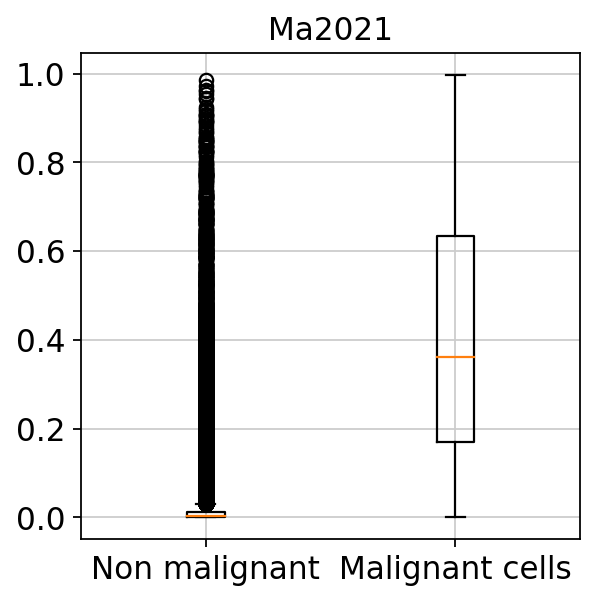

In [60]:
label = pd.read_csv("/home/glab/liver_atlas/Ma2021/Ma2021_cell_hECA.tsv", sep = '\t')
label['predict_malignancy'] = predict
label['type'][label['type'] != "Malignant cells"] = "Non malignant"
df = label[['type', 'predict_malignancy']]
df
import matplotlib.pyplot as plt
plt.rcParams["font.size"]=10#设置字体大小
plt.boxplot([df.predict_malignancy[df.type=='Non malignant'], df.predict_malignancy[df.type=='Malignant cells']],labels=['Non malignant', 'Malignant cells'])
plt.title('Ma2021')
plt.show()

# 10X samples-unimodal CNV score

In [105]:
epthelial_markers = ['EPCAM', 'GPC3', 'SPINK1', 'AKR1B10', 'KRT19', 'ALB', 'CYP2E1']

In [113]:
path = './SingleCell/20200215-HCC-Pt13c-Tumor'
print(path)
data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=False)

./SingleCell/20200215-HCC-Pt13c-Tumor
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [107]:
genes = pd.read_csv(path+'/filtered_feature_bc_matrix/features.tsv.gz',sep = '\t', compression='gzip', header = None)

In [114]:
cellAnn = pd.read_csv(path +'/cellAnnotation.txt', delim_whitespace=True, 
                                  usecols=['barcodes','UMAP_1', 'UMAP_2', 'Malign.type', 'Epithelial.corr', 'Cell.Type'], index_col=['barcodes'])
    # h5ad files
    # data = sc.read_h5ad('../../lxq/PDAC/dynamics/PDAC/P4_seurat2scanpy.h5ad')
    # data = sc.read_h5ad('./CHOL/malig_choose.h5ad')

data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
    # sc.pp.filter_cells(data, min_genes=200)
sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
mito_genes = data.var_names.str.startswith('MT-')
data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
data.obs['n_counts'] = data.X.sum(axis=1).A1
mitoThres = 0.15
    # data = data[data.obs.percent_mito < mitoThres, :]
data = data[cellAnn.index + '-1',]
    # 标准化:TPM
sc.pp.normalize_total(data, target_sum=1e4)
sc.pp.log1p(data)
sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
print("finish regressing...!!!")

filtered out 16449 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:01:34)
finish regressing...!!!


In [115]:
# 整理数据
cntMatrix = sparse.csr_matrix(data.X).todense()
cellName = np.array(data.obs.index)
for i in range(len(cellName)):
    newName = cellName[i].split('-')[0]
    cellName[i] = newName
arr = pd.DataFrame(data=cntMatrix, index=cellName, columns=data.var.index)
    
selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)
arr = arr.loc[:,selectGene['0']]
sc.tl.tsne(data)
sc.pp.neighbors(data)
sc.tl.umap(data)
    # path = './SingleCell/' + predictSample
    # cellAnn = pd.read_csv(path+'/cellAnnotation.txt', delim_whitespace=True, 
    #                     usecols=['barcodes','tSNE_1','tSNE_2'], index_col=['barcodes'])
    # decomp_data = pd.merge(arr, cellAnn, how='inner', left_index=True, right_index=True)
    # predict = reg.predict(decomp_data.iloc[:,:-2])
    # decomp_data = decomp_data.loc[:,['tSNE_1','tSNE_2']]
print("finish umap...!!!")
THRESHOLD = 0.5
predictSample = name
predict = reg.predict(arr)

computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:15)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:10)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)
finish umap...!!!


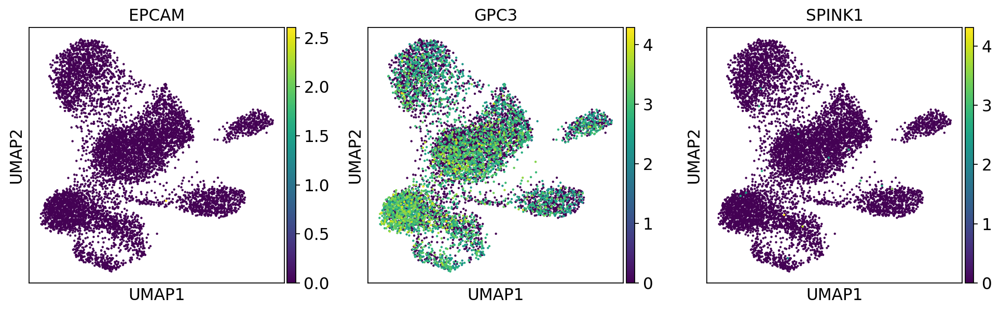

In [110]:
sc.pl.umap(data, color=epthelial_markers)

In [132]:
cellAnn.index = cellAnn.index + '-1'
cellAnn['Epithelial.corr']

barcodes
AAACCTGAGACCGGAT-1    0.151942
AAACCTGAGAGTACAT-1    0.114838
AAACCTGAGGCTCAGA-1    0.115326
AAACCTGAGTTCGCAT-1    0.081873
AAACCTGCAATTGCTG-1    0.075766
                        ...   
TTTGTCATCCTCATTA-1    0.092334
TTTGTCATCGAGAGCA-1    0.101545
TTTGTCATCGTTGACA-1    0.114064
TTTGTCATCTAGCACA-1    0.085529
TTTGTCATCTGGTATG-1    0.090849
Name: Epithelial.corr, Length: 7770, dtype: float64

In [135]:
predict = predict > THRESHOLD
data.obs['malignancy'] = predict
data.obs['Epithelial.corr'] = cellAnn['Epithelial.corr']
data.obs['Cell.Type'] = cellAnn['Cell.Type']
data.obs

,percent_mito,n_counts,malignancy,Epithelial.corr,Cell.Type
AAACCTGAGACCGGAT-1,0.327971,1119.0,True,0.151942,Epithelial
AAACCTGAGAGTACAT-1,0.515640,1055.0,False,0.114838,T.cells.CD8
AAACCTGAGGCTCAGA-1,0.421795,780.0,True,0.115326,Epithelial
AAACCTGAGTTCGCAT-1,0.417745,541.0,False,0.081873,Unknown
AAACCTGCAATTGCTG-1,0.431542,577.0,False,0.075766,T.cells.CD4
...,...,...,...,...,...
TTTGTCATCCTCATTA-1,0.370317,694.0,False,0.092334,B.cells
TTTGTCATCGAGAGCA-1,0.362565,764.0,False,0.101545,Epithelial
TTTGTCATCGTTGACA-1,0.296024,679.0,False,0.114064,Epithelial
TTTGTCATCTAGCACA-1,0.431818,616.0,False,0.085529,Unknown


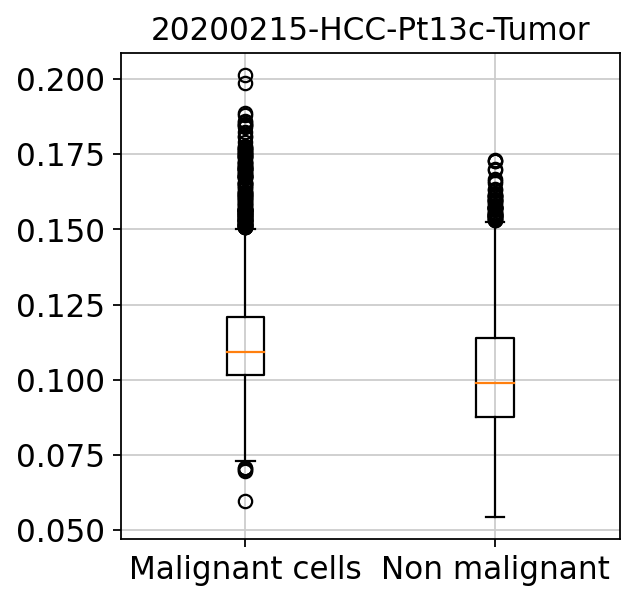

In [134]:
plt.boxplot([data.obs['Epithelial.corr'][data.obs['malignancy']==True], data.obs['Epithelial.corr'][data.obs['malignancy']==False]],
            labels=['Malignant cells', 'Non malignant'])
plt.title('20200215-HCC-Pt13c-Tumor')
plt.show()

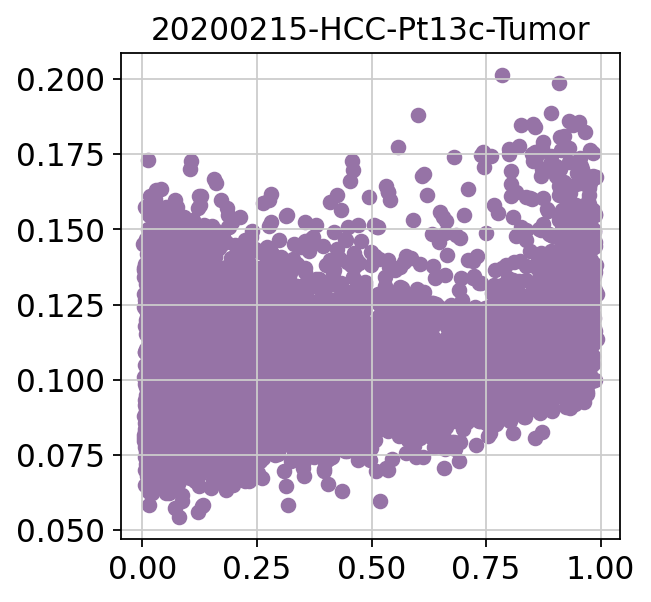

In [125]:
plt.scatter(data.obs['malignancy'], data.obs['Epithelial.corr'], color='#9673A6')
plt.title('20200215-HCC-Pt13c-Tumor')
plt.show()

./SingleCell/20200217-LUAD-LX653-Tumor
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
filtered out 14881 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:36)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:11)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
finish uma

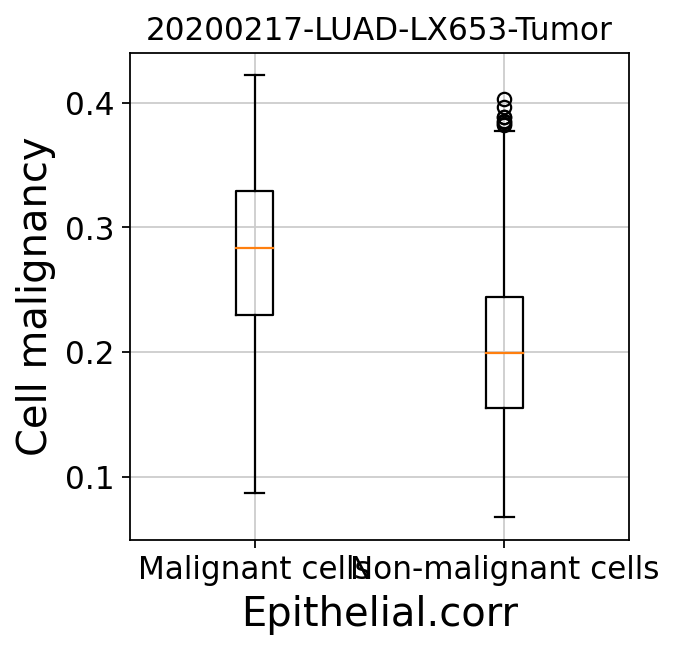

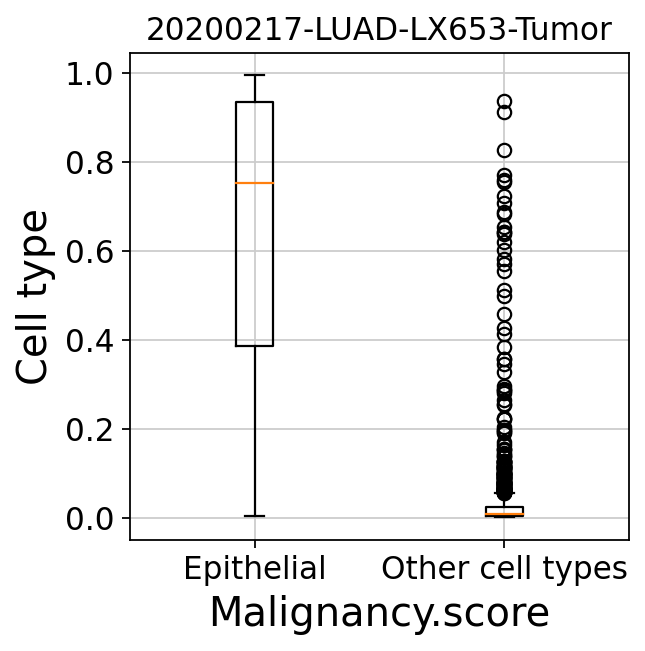

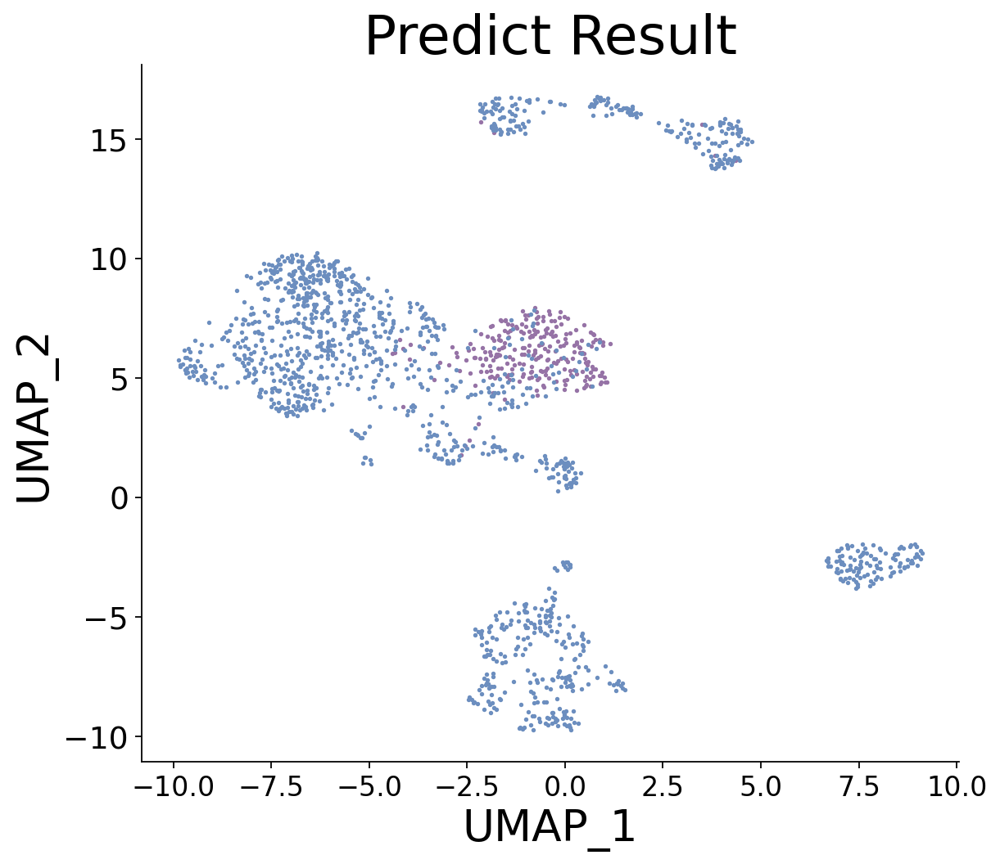

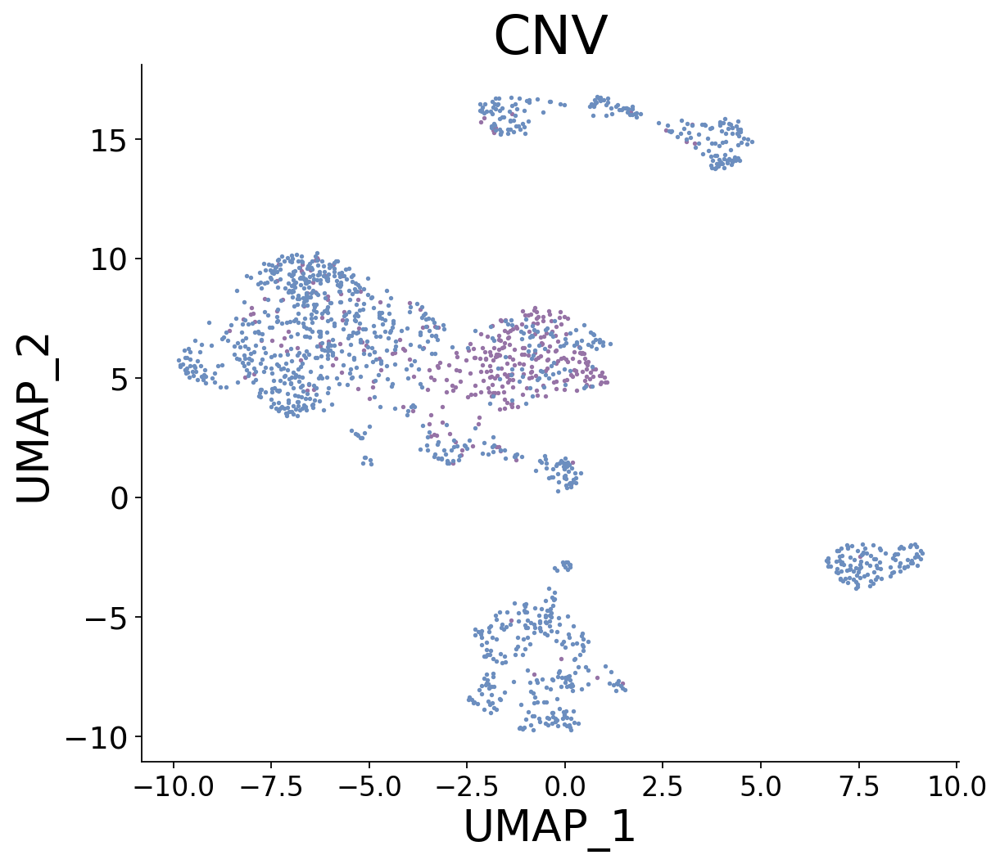

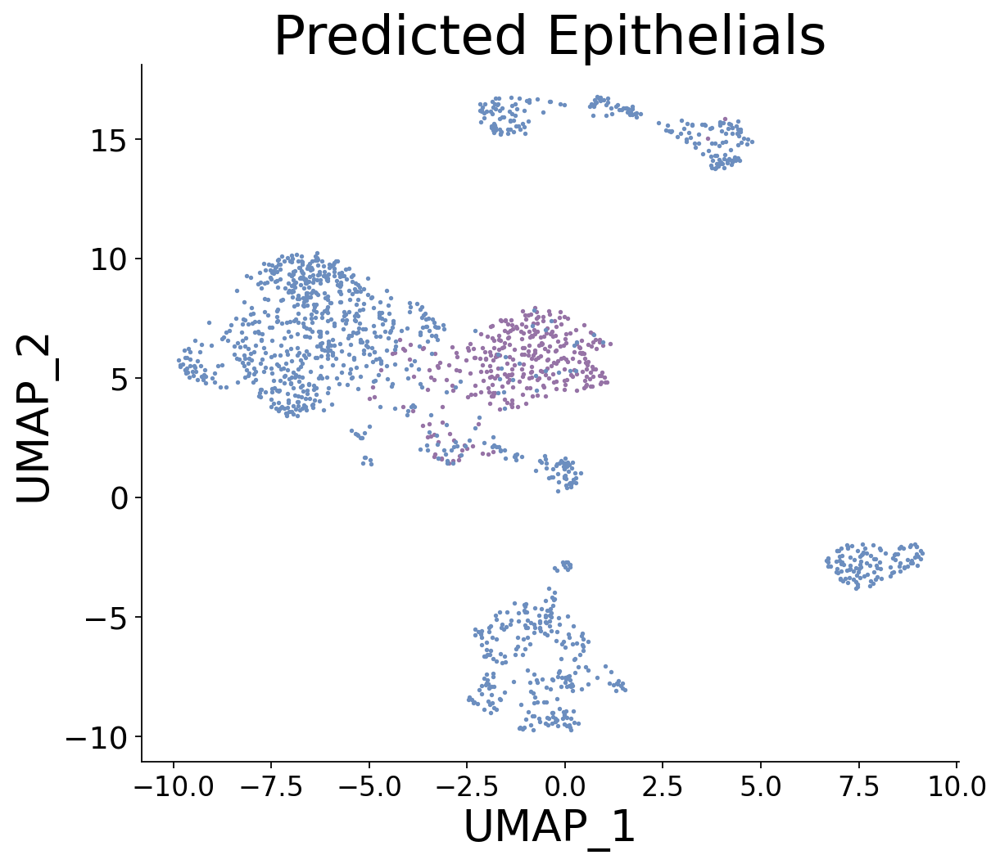

In [13]:
names = ['20200215-HCC-Pt13c-Tumor', '20200215-HCC-Pt14a-Tumor', '20200215-HCC-Pt14c-Tumor', '20200215-HCC-Pt14d-Tumor',
         '20200216-LUAD-CRR073022-LUAD1-Tumor', '20200216-LUAD-CRR073023-LUAD2-Tumor', '20200216-LUAD-CRR073024-LUAD3-Tumor',
         '20200216-LUAD-CRR073025-LUAD4-Tumor', '20200216-LUAD-CRR073026-LUAD5-Tumor',
         '20200208-PAC-CRR034496-T1-Tumor', '20200208-PAC-CRR034499-T4-Tumor', '20200208-PAC-CRR034500-T5-Tumor', 
         '20200208-PAC-CRR034501-T6-Tumor', '20200208-PAC-CRR034505-T10-Tumor', '20200208-PAC-CRR034506-T11-Tumor',
         '20200208-PAC-CRR034507-T12-Tumor', '20200217-LUAD-LX653-Tumor', '20200217-LUAD-LX661-Tumor',
         '20200217-LUAD-LX675-Tumor','20200217-LUAD-LX676-Tumor', '20200217-LUAD-LX682-Tumor', '20200217-LUAD-LX684-Tumor']
# Samples selected
names = ['20200217-LUAD-LX653-Tumor', '20200208-PAC-CRR034496-T1-Tumor', '20200215-HCC-Pt13c-Tumor',
         '20200217-LUAD-LX684-Tumor', '20200215-HCC-Pt14d-Tumor','20200208-PAC-CRR034505-T10-Tumor']
for name in names:
    path = './SingleCell/' + name
    print(path)
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=False)
    cellAnn = pd.read_csv(path +'/cellAnnotation.txt', delim_whitespace=True, 
                          usecols=['barcodes','UMAP_1', 'UMAP_2', 'Malign.type', 'Epithelial.corr', 'Cell.Type'],
                          index_col=['barcodes'])
    # h5ad files
    # data = sc.read_h5ad('../../lxq/PDAC/dynamics/PDAC/P4_seurat2scanpy.h5ad')
    # data = sc.read_h5ad('./CHOL/malig_choose.h5ad')

    data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
    # sc.pp.filter_cells(data, min_genes=200)
    sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
    mito_genes = data.var_names.str.startswith('MT-')
    data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
    data.obs['n_counts'] = data.X.sum(axis=1).A1
    mitoThres = 0.15
    # data = data[data.obs.percent_mito < mitoThres, :]
    data = data[cellAnn.index + '-1',]
    # 标准化:TPM
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
    print("finish regressing...!!!")
    # 整理数据
    cntMatrix = sparse.csr_matrix(data.X).todense()
    cellName = np.array(data.obs.index)
    for i in range(len(cellName)):
        newName = cellName[i].split('-')[0]
        cellName[i] = newName
    arr = pd.DataFrame(data=cntMatrix, index=cellName, columns=data.var.index)
    
    selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)
    arr = arr.loc[:,selectGene['0']]
    sc.tl.tsne(data)
    sc.pp.neighbors(data)
    sc.tl.umap(data)
    # path = './SingleCell/' + predictSample
    # cellAnn = pd.read_csv(path+'/cellAnnotation.txt', delim_whitespace=True, 
    #                     usecols=['barcodes','tSNE_1','tSNE_2'], index_col=['barcodes'])
    # decomp_data = pd.merge(arr, cellAnn, how='inner', left_index=True, right_index=True)
    # predict = reg.predict(decomp_data.iloc[:,:-2])
    # decomp_data = decomp_data.loc[:,['tSNE_1','tSNE_2']]
    print("finish umap...!!!")
    THRESHOLD = 0.5
    predictSample = name
    predict = reg.predict(arr)
    data.obs['malignancy.score'] = predict
    predict = predict > THRESHOLD
    data.obs['malignant.label'] = predict
    cellAnn.index = cellAnn.index + '-1'
    data.obs['Epithelial.corr'] = cellAnn['Epithelial.corr']
    data.obs['Cell.Type'] = cellAnn['Cell.Type']
    plt.boxplot([data.obs['Epithelial.corr'][data.obs['malignant.label']==True], data.obs['Epithelial.corr'][data.obs['malignant.label']==False]],
            labels=['Malignant cells', 'Non-malignant cells'])
    plt.xlabel('Epithelial.corr', fontsize = 18)
    plt.ylabel('Cell malignancy', fontsize = 18)
    plt.title(name)
    plt.show()
    
    plt.boxplot([data.obs['malignancy.score'][data.obs['Cell.Type']=="Epithelial"],
                 data.obs['malignancy.score'][data.obs['Cell.Type']!="Epithelial"]],
                labels=['Epithelial', 'Other cell types'])
    plt.xlabel('Malignancy.score', fontsize = 18)
    plt.ylabel('Cell type', fontsize = 18)
    plt.title(name)
    plt.show()
    
    # decomp_data = data.obsm['X_tsne']
    decomp_data = data.obsm['X_umap']
    pred_true_idx  = predict == 1
    pred_false_idx = predict == 0

    ALPHA = 1
    S = 2
    path = './Predict/'
    plt.figure(1, figsize=(8,7))
    plt.grid(b=False)
    plt.scatter(x=decomp_data[pred_true_idx,0] ,y=decomp_data[pred_true_idx,1] ,c='#9673A6',s=S,label='Malignant',alpha=ALPHA)
    plt.scatter(x=decomp_data[pred_false_idx,0],y=decomp_data[pred_false_idx,1],c='#6C8EBF',s=S,label='nonMalignant',alpha=ALPHA)
    # plt.legend(loc='upper left', fontsize = 15)
    # plt.xlabel('tSNE_1')
    # plt.ylabel('tSNE_2')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=17)
    plt.xlabel('UMAP_1', fontsize=24)
    plt.ylabel('UMAP_2', fontsize=24)
    plt.title('Predict Result', fontsize=30)
        
    ax = plt.gca()
    ax.spines.right.set_color('none')
    ax.spines['top'].set_visible(False)
    plt.savefig(path+predictSample+'.jpg', dpi=100)
    plt.show()
    
    tag_true_idx = cellAnn['Malign.type'] == 'malignant'
    tag_false_idx = cellAnn['Malign.type'] == 'nonMalignant'
    plt.figure(2, figsize=(8,7))
    plt.grid(b=False)
    plt.scatter(x=decomp_data[tag_true_idx,0] ,y=decomp_data[tag_true_idx,1] ,c='#9673A6',s=S,label='Malignant',alpha=ALPHA)
    plt.scatter(x=decomp_data[tag_false_idx,0],y=decomp_data[tag_false_idx,1],c='#6C8EBF',s=S,label='nonMalignant',alpha=ALPHA)
    # plt.legend(loc='upper left', fontsize = 15)
    # plt.xlabel('tSNE_1')
    # plt.ylabel('tSNE_2')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=17)
    plt.xlabel('UMAP_1', fontsize=24)
    plt.ylabel('UMAP_2', fontsize=24)
    plt.title('CNV', fontsize=30) 
    ax = plt.gca()
    ax.spines.right.set_color('none')
    ax.spines['top'].set_visible(False)
    
    plt.savefig(path+predictSample+'-CNV.jpg', dpi=100)
    plt.show()
    
    tag_true_idx = cellAnn['Cell.Type'] == 'Epithelial'
    tag_false_idx = cellAnn['Cell.Type'] != 'Epithelial'
    plt.figure(3, figsize=(8,7))
    plt.grid(b=False)
    plt.scatter(x=decomp_data[tag_true_idx,0] ,y=decomp_data[tag_true_idx,1] ,c='#9673A6',s=S,label='Epithelial',alpha=ALPHA)
    plt.scatter(x=decomp_data[tag_false_idx,0],y=decomp_data[tag_false_idx,1],c='#6C8EBF',s=S,label='Others',alpha=ALPHA)
    # plt.legend(loc='upper left', fontsize = 15)
    # plt.xlabel('tSNE_1')
    # plt.ylabel('tSNE_2')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=17)
    plt.xlabel('UMAP_1', fontsize=24)
    plt.ylabel('UMAP_2', fontsize=24)
    plt.title('Predicted Epithelials', fontsize=30) 
    ax = plt.gca()
    ax.spines.right.set_color('none')
    ax.spines['top'].set_visible(False)
    plt.savefig(path+predictSample+'-Epithelial.jpg', dpi=100)
    plt.show()


# Plot markers

./SingleCell/20200217-LUAD-LX653-Tumor
... reading from cache file cache/SingleCell-20200217-LUAD-LX653-Tumor-filtered_feature_bc_matrix-matrix.h5ad
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:41)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:21)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:23)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
finish umap...!!!


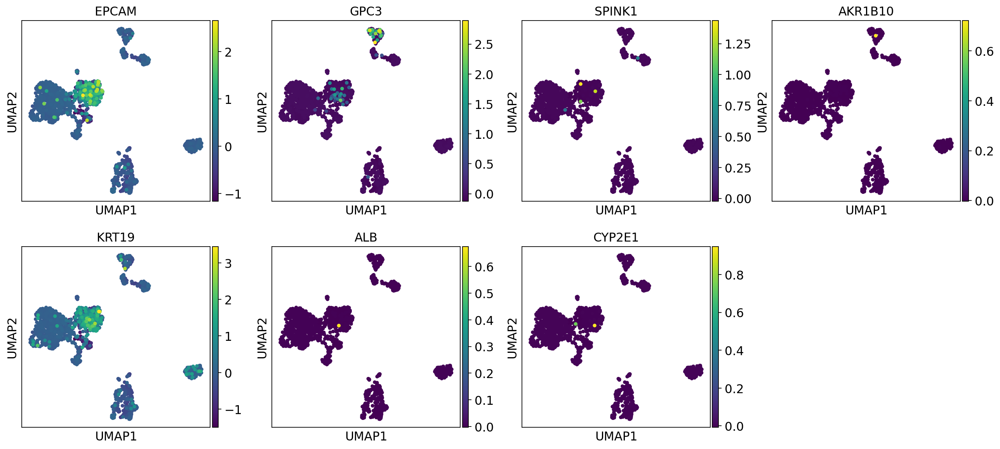

./SingleCell/20200208-PAC-CRR034496-T1-Tumor
... reading from cache file cache/SingleCell-20200208-PAC-CRR034496-T1-Tumor-filtered_feature_bc_matrix-matrix.h5ad
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:44)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:27)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:29)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
finish umap...!!!


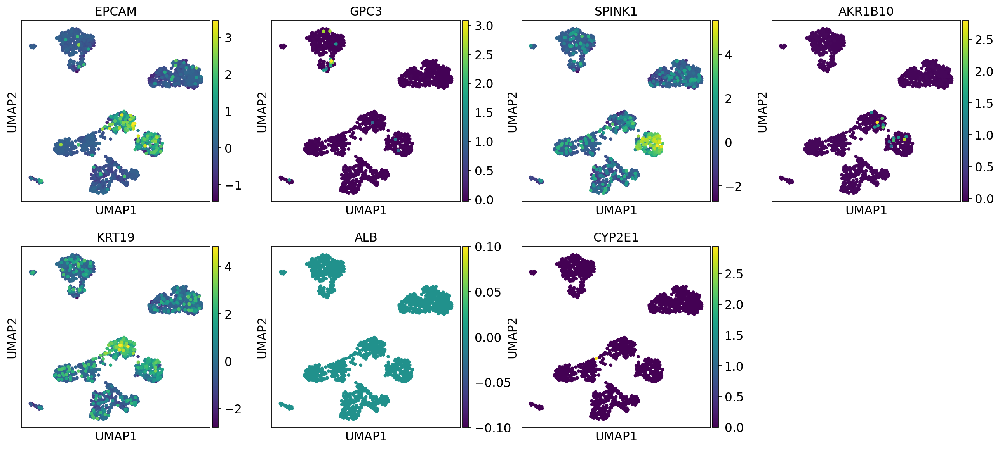

./SingleCell/20200215-HCC-Pt13c-Tumor
... reading from cache file cache/SingleCell-20200215-HCC-Pt13c-Tumor-filtered_feature_bc_matrix-matrix.h5ad
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:01:55)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:02:13)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:29)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
finish umap...!!!


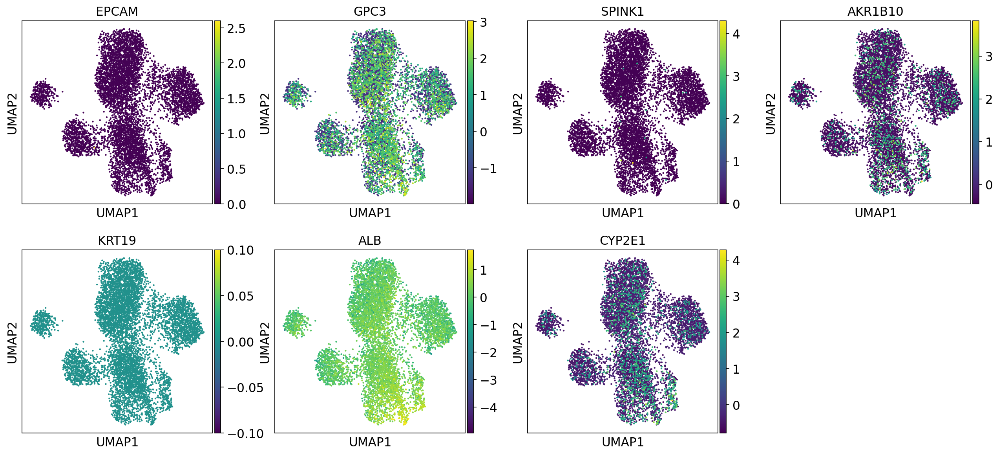

./SingleCell/20200217-LUAD-LX684-Tumor
... writing an h5ad cache file to speedup reading next time
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:56)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:38)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:41)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
finish umap...!!!


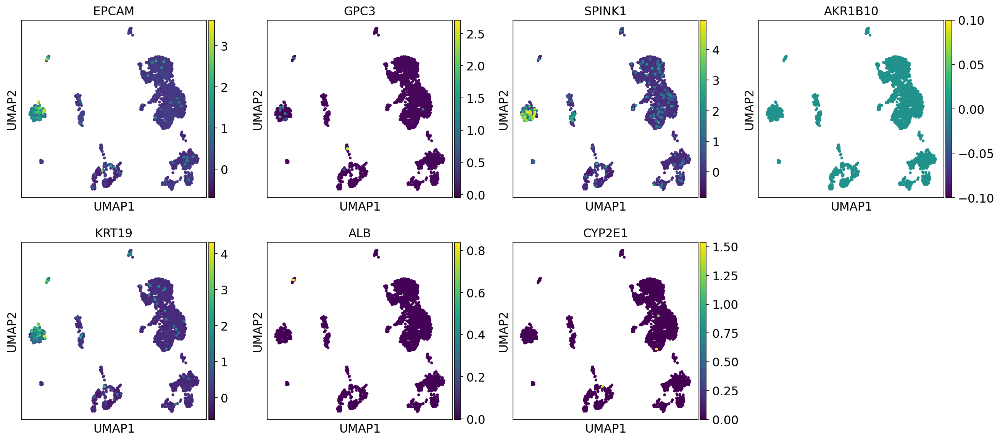

./SingleCell/20200215-HCC-Pt14d-Tumor
... reading from cache file cache/SingleCell-20200215-HCC-Pt14d-Tumor-filtered_feature_bc_matrix-matrix.h5ad
normalizing counts per cell
    finished (0:00:00)


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:06:07)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:06:11)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:07:17)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)
finish umap...!!!


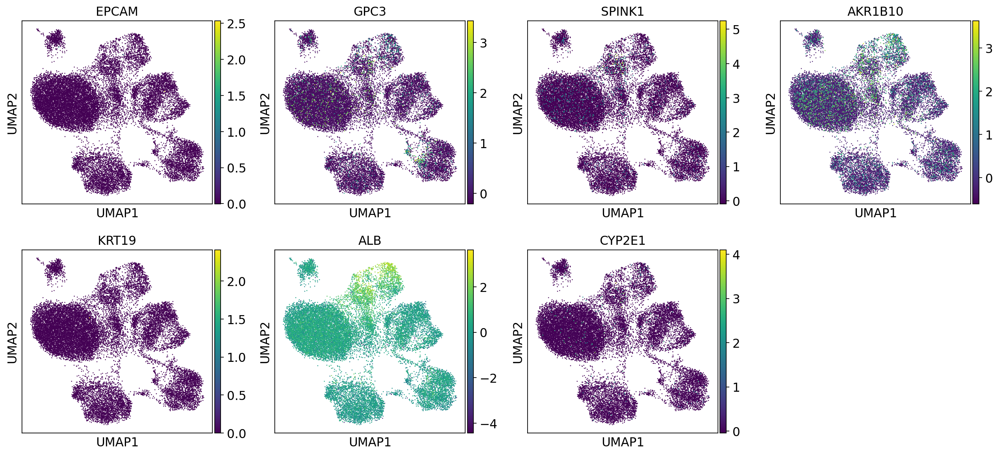

./SingleCell/20200208-PAC-CRR034505-T10-Tumor
... reading from cache file cache/SingleCell-20200208-PAC-CRR034505-T10-Tumor-filtered_feature_bc_matrix-matrix.h5ad
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:37)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:17)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:19)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
finish umap...!!!


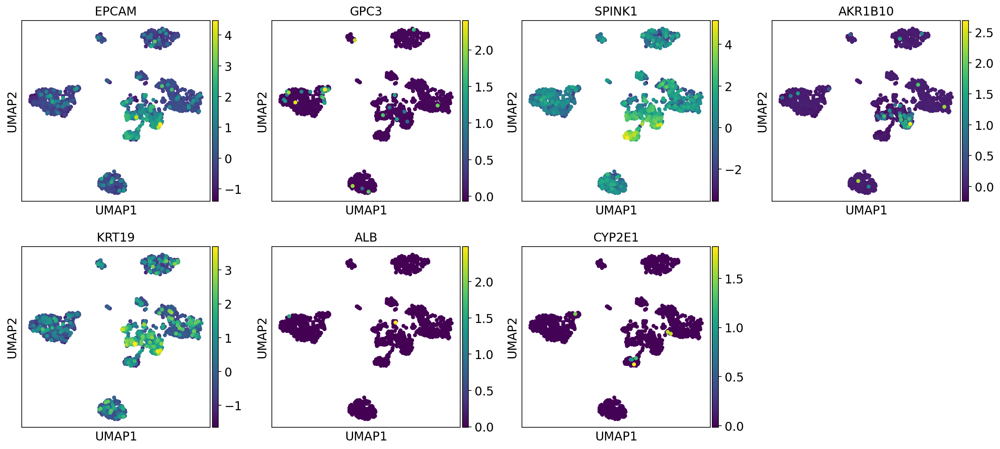

In [14]:
epthelial_markers = ['EPCAM', 'GPC3', 'SPINK1', 'AKR1B10', 'KRT19', 'ALB', 'CYP2E1']
# Samples selected
names = ['20200217-LUAD-LX653-Tumor', '20200208-PAC-CRR034496-T1-Tumor', '20200215-HCC-Pt13c-Tumor',
         '20200217-LUAD-LX684-Tumor', '20200215-HCC-Pt14d-Tumor','20200208-PAC-CRR034505-T10-Tumor']
for name in names:
    path = './SingleCell/' + name
    print(path)
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=True)
    cellAnn = pd.read_csv(path +'/cellAnnotation.txt', delim_whitespace=True, 
                          usecols=['barcodes','UMAP_1', 'UMAP_2', 'Malign.type', 'Epithelial.corr', 'Cell.Type'],
                          index_col=['barcodes'])
    data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
    # sc.pp.filter_cells(data, min_genes=200)
    # sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
    mito_genes = data.var_names.str.startswith('MT-')
    data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
    data.obs['n_counts'] = data.X.sum(axis=1).A1
    mitoThres = 0.15
    # data = data[data.obs.percent_mito < mitoThres, :]
    data = data[cellAnn.index + '-1',]
    # 标准化:TPM
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
    print("finish regressing...!!!")
    sc.tl.tsne(data)
    sc.pp.neighbors(data)
    sc.tl.umap(data)
    # path = './SingleCell/' + predictSample
    # cellAnn = pd.read_csv(path+'/cellAnnotation.txt', delim_whitespace=True, 
    #                     usecols=['barcodes','tSNE_1','tSNE_2'], index_col=['barcodes'])
    # decomp_data = pd.merge(arr, cellAnn, how='inner', left_index=True, right_index=True)
    # predict = reg.predict(decomp_data.iloc[:,:-2])
    # decomp_data = decomp_data.loc[:,['tSNE_1','tSNE_2']]
    print("finish umap...!!!")
    sc.pl.umap(data, color=epthelial_markers)

# Organoid

cc001
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc001-outs-filtered_feature_bc_matrix-matrix.h5ad
filtered out 52 cells that have less than 200 genes expressed


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:24)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:52)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:42)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)
finish umap...!!!


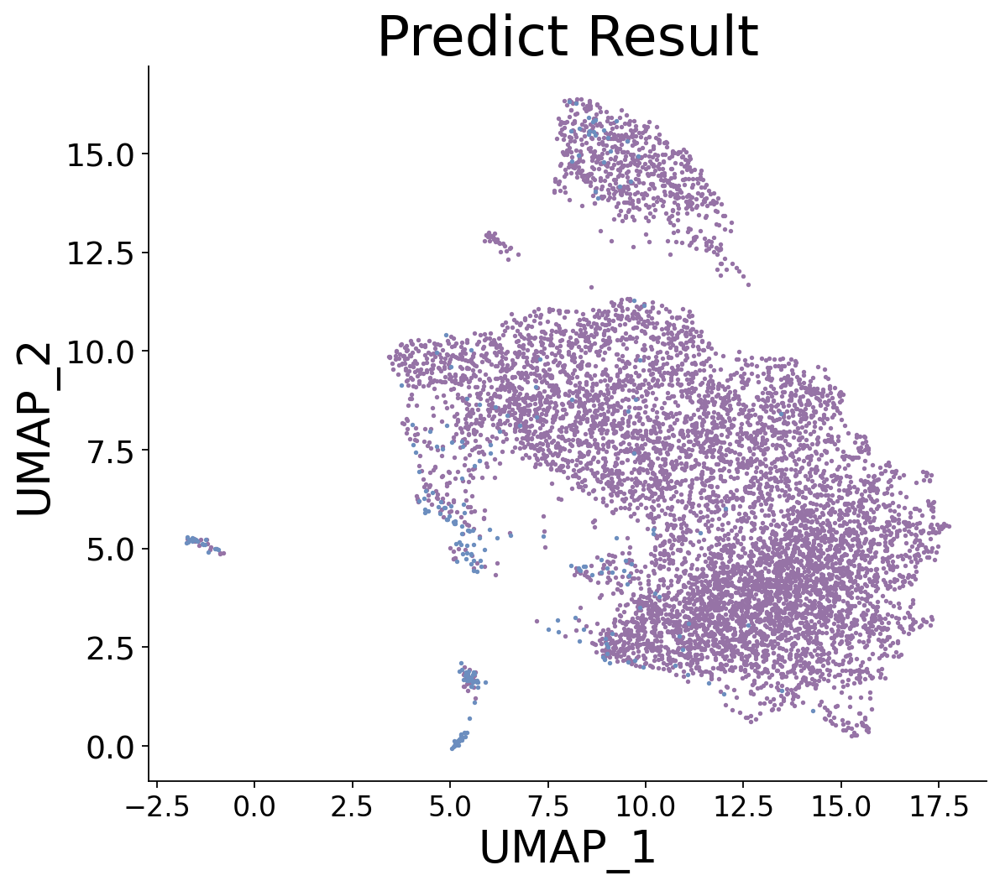

cc002
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc002-outs-filtered_feature_bc_matrix-matrix.h5ad


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:03:25)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:03:29)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:04:28)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
finish umap...!!!


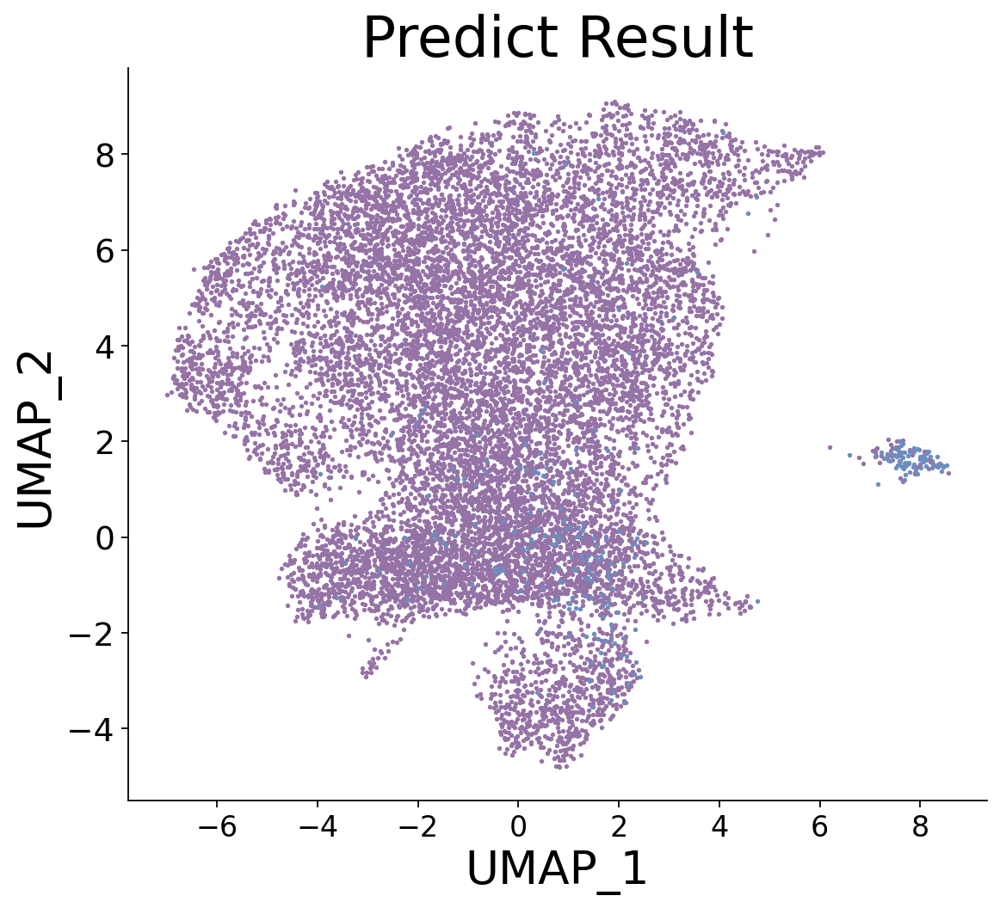

cc003
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc003-outs-filtered_feature_bc_matrix-matrix.h5ad
filtered out 3 cells that have less than 200 genes expressed


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:34)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:08)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:48)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
finish umap...!!!


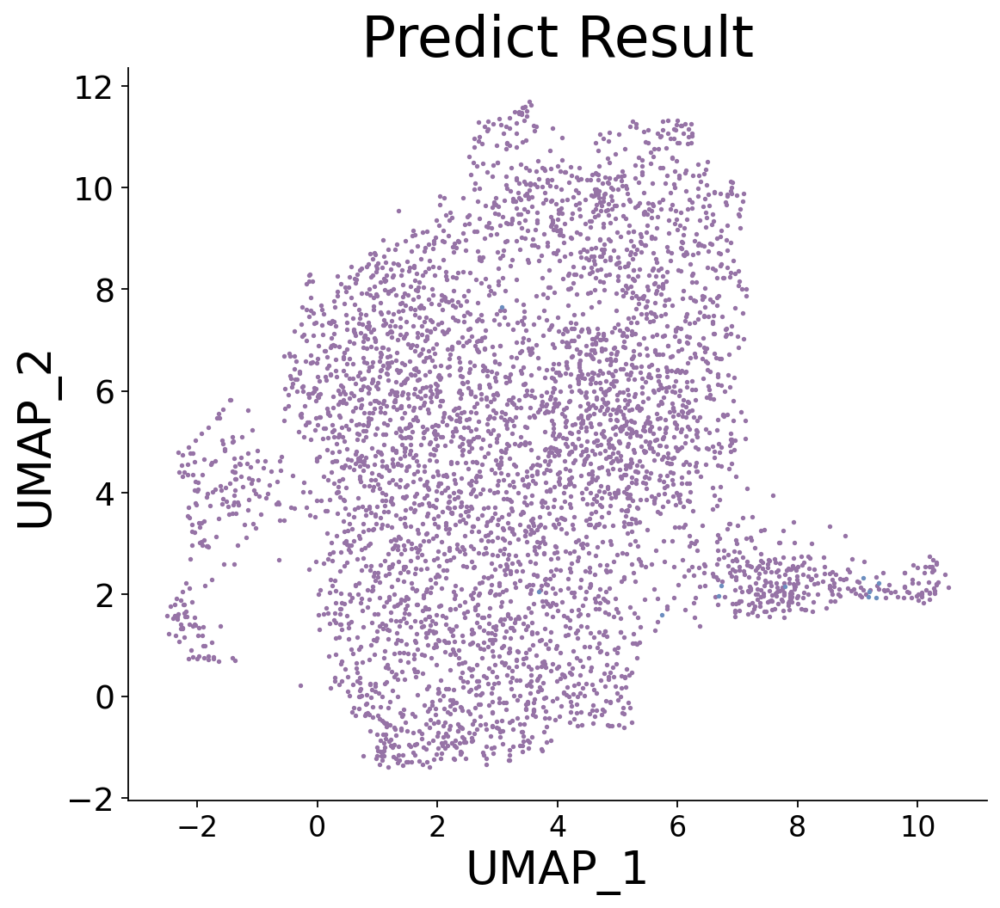

cc006
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc006-outs-filtered_feature_bc_matrix-matrix.h5ad
filtered out 10 cells that have less than 200 genes expressed


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:40)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:02:44)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:03:42)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)
finish umap...!!!


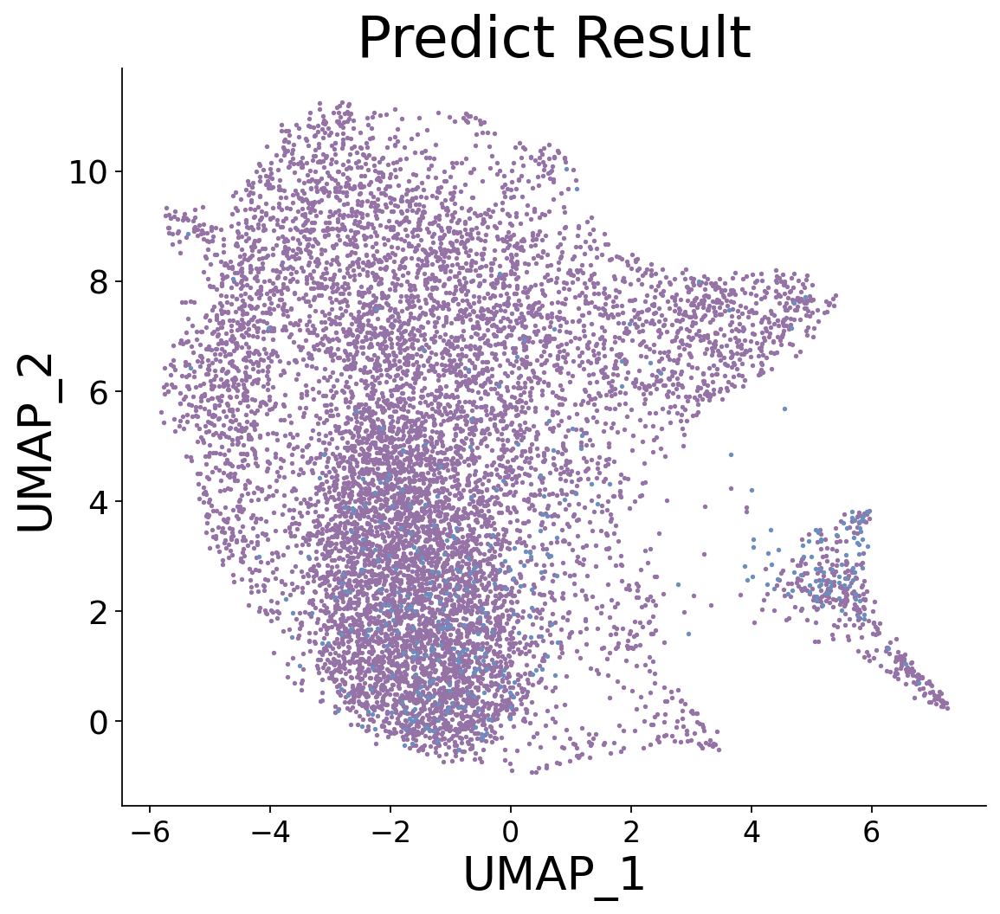

CC009
... reading from cache file cache/..-..-Shanyr-data-cellranger-CC009-outs-filtered_feature_bc_matrix-matrix.h5ad
filtered out 812 cells that have less than 200 genes expressed


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:07)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:31)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:11)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
finish umap...!!!


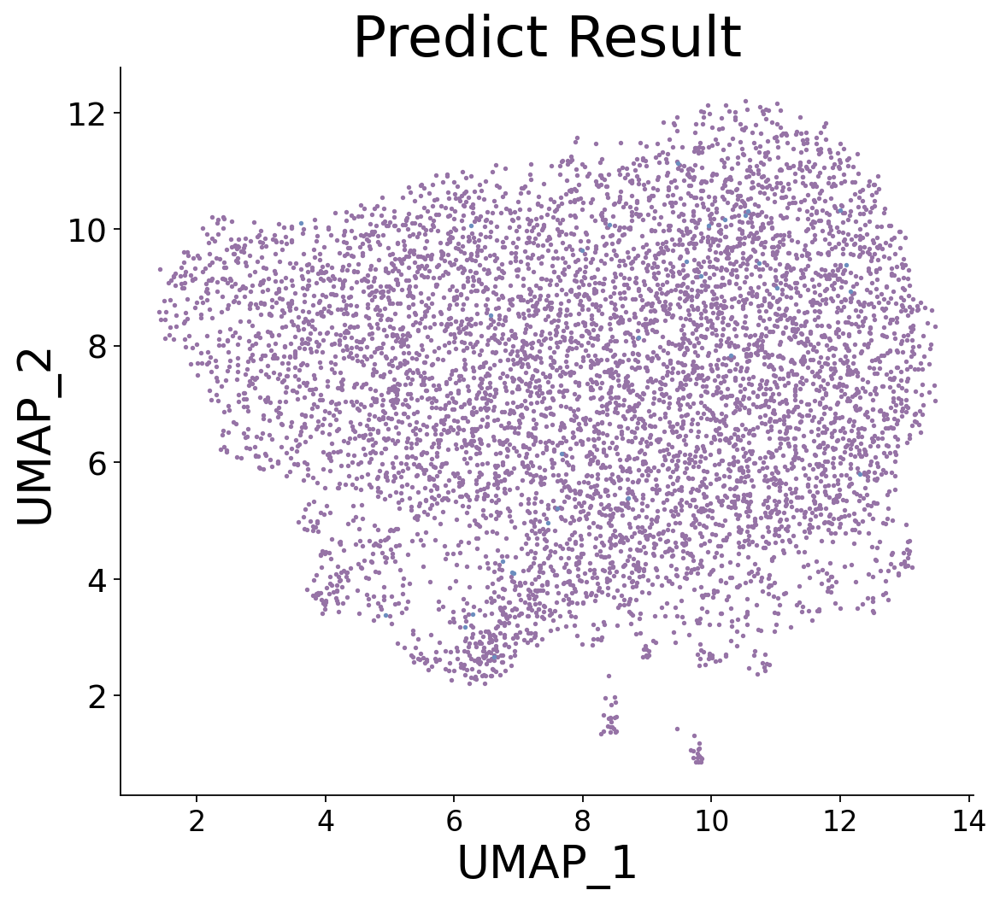

icc010
... reading from cache file cache/..-..-Shanyr-data-cellranger-icc010-outs-filtered_feature_bc_matrix-matrix.h5ad
filtered out 143 cells that have less than 200 genes expressed


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:45)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:47)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:27)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
finish umap...!!!


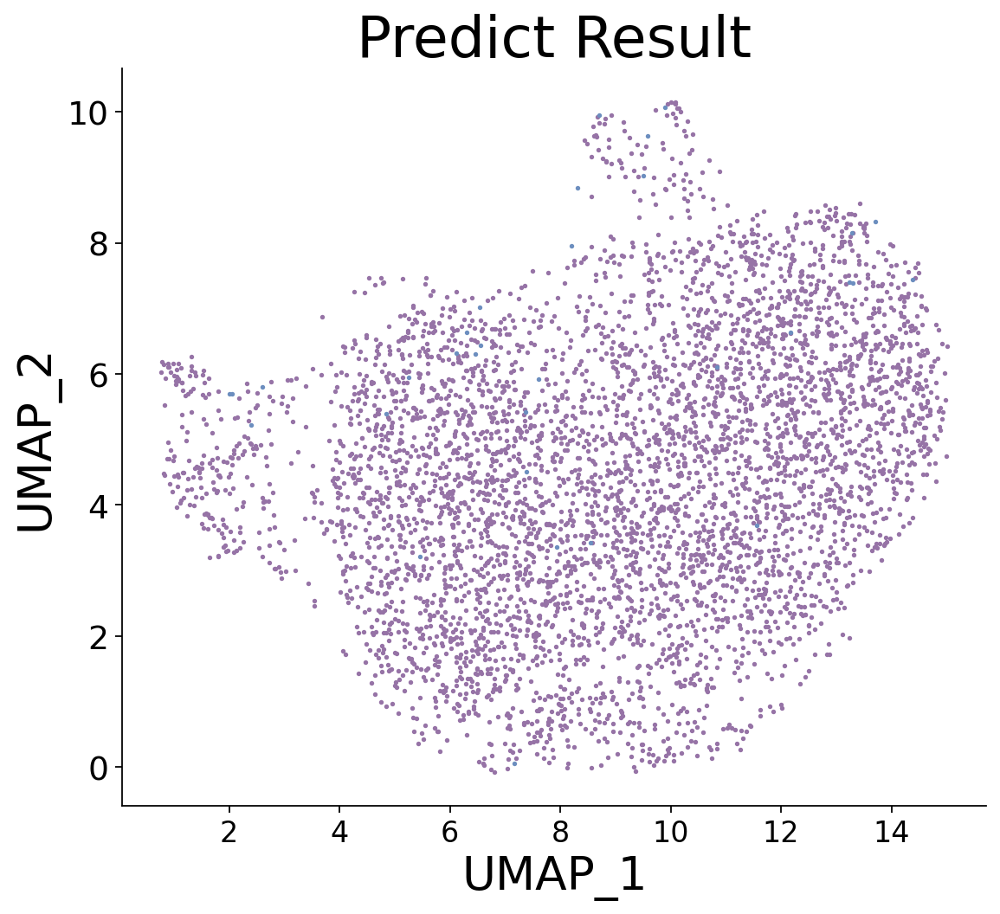

In [7]:
# names = ['cc001', 'cc002', 'cc003', 'cc005', 'cc006', 'CC009', 'icc010', 'nb001', 'nb002']
# Samples selected
names = ['cc001', 'cc002', 'cc003', 'cc006', 'CC009', 'icc010']
for name in names:
    print(name)
    path = '../../Shanyr/data/cellranger/' + name + '/outs/'
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=True)
    # h5ad files
    # data = sc.read_h5ad('../../lxq/PDAC/dynamics/PDAC/P4_seurat2scanpy.h5ad')
    # data = sc.read_h5ad('./CHOL/malig_choose.h5ad')

    data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
    sc.pp.filter_cells(data, min_genes=200)
    # sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
    mito_genes = data.var_names.str.startswith('MT-')
    data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
    data.obs['n_counts'] = data.X.sum(axis=1).A1
    mitoThres = 0.15
    data = data[data.obs.percent_mito < mitoThres, :]
    # 标准化:TPM
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
    print("finish regressing...!!!")
    # 整理数据
    cntMatrix = sparse.csr_matrix(data.X).todense()
    cellName = np.array(data.obs.index)
    for i in range(len(cellName)):
        newName = cellName[i].split('-')[0]
        cellName[i] = newName
    arr = pd.DataFrame(data=cntMatrix, index=cellName, columns=data.var.index)
    # 选择基因
    # selectGene = np.loadtxt('./txtData/selectGenesByVar-all.txt', dtype=str)
    selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)['0']
    # selectGene = np.array(selectGene).tolist()[0]
    # arr = arr.loc[:,selectGene]
    
    # 这里是为了防止预测数据集里的基因没有在之前的步骤中被选中，或者选中的基因在预测集里没有
    pred_mtx = pd.DataFrame(np.zeros((arr.shape[0], len(selectGene))))
    genes = data.var.index
    lostGene = []
    cnt = 0
    for i in range(len(selectGene)):
        if selectGene[i] in genes:
            loc = np.where(genes == selectGene[i])
            j = loc[0][0]
            pred_mtx.iloc[:,i] = arr.iloc[:,j].values
        else:
            lostGene.append(selectGene[i])
            cnt += 1
    sc.tl.tsne(data)
    sc.pp.neighbors(data)
    sc.tl.umap(data)
    print("finish umap...!!!")
    # path = './SingleCell/' + predictSample
    # cellAnn = pd.read_csv(path+'/cellAnnotation.txt', delim_whitespace=True, 
    #                     usecols=['barcodes','tSNE_1','tSNE_2'], index_col=['barcodes'])
    # decomp_data = pd.merge(arr, cellAnn, how='inner', left_index=True, right_index=True)
    # predict = reg.predict(decomp_data.iloc[:,:-2])
    # decomp_data = decomp_data.loc[:,['tSNE_1','tSNE_2']]
    THRESHOLD = 0.5
    predictSample = name
    predict = reg.predict(pred_mtx)
    # predict = reg.predict(arr)
    predict = predict > THRESHOLD
    # decomp_data = data.obsm['X_tsne']
    decomp_data = data.obsm['X_umap']
    pred_true_idx  = predict == 1
    pred_false_idx = predict == 0

    ALPHA = 1
    S = 2
    path = './Predict/'
    plt.figure(1,figsize=(8,7))
    plt.grid(b=False)
    plt.scatter(x=decomp_data[pred_true_idx,0] ,y=decomp_data[pred_true_idx,1] ,c='#9673A6',s=S,label='Malignant',alpha=ALPHA)
    plt.scatter(x=decomp_data[pred_false_idx,0],y=decomp_data[pred_false_idx,1],c='#6C8EBF',s=S,label='nonMalignant',alpha=ALPHA)
    # plt.legend(loc='upper left', fontsize = 15)
    # plt.xlabel('tSNE_1')
    # plt.ylabel('tSNE_2')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=17)
    plt.xlabel('UMAP_1', fontsize=24)
    plt.ylabel('UMAP_2', fontsize=24)
    plt.title('Predict Result', fontsize=30)
        
    ax = plt.gca()
    ax.spines.right.set_color('none')
    ax.spines['top'].set_visible(False)
    
    plt.savefig(path+predictSample+'.jpg', dpi=100)
    plt.show()

YS2306057_AV_230615
... reading from cache file cache/..-..-Shanyr-liver-data-YS2306057_AV_230615-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 7552 × 36601
    var: 'gene_ids', 'feature_types'
filtered out 12416 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:24)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:21)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:13)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished

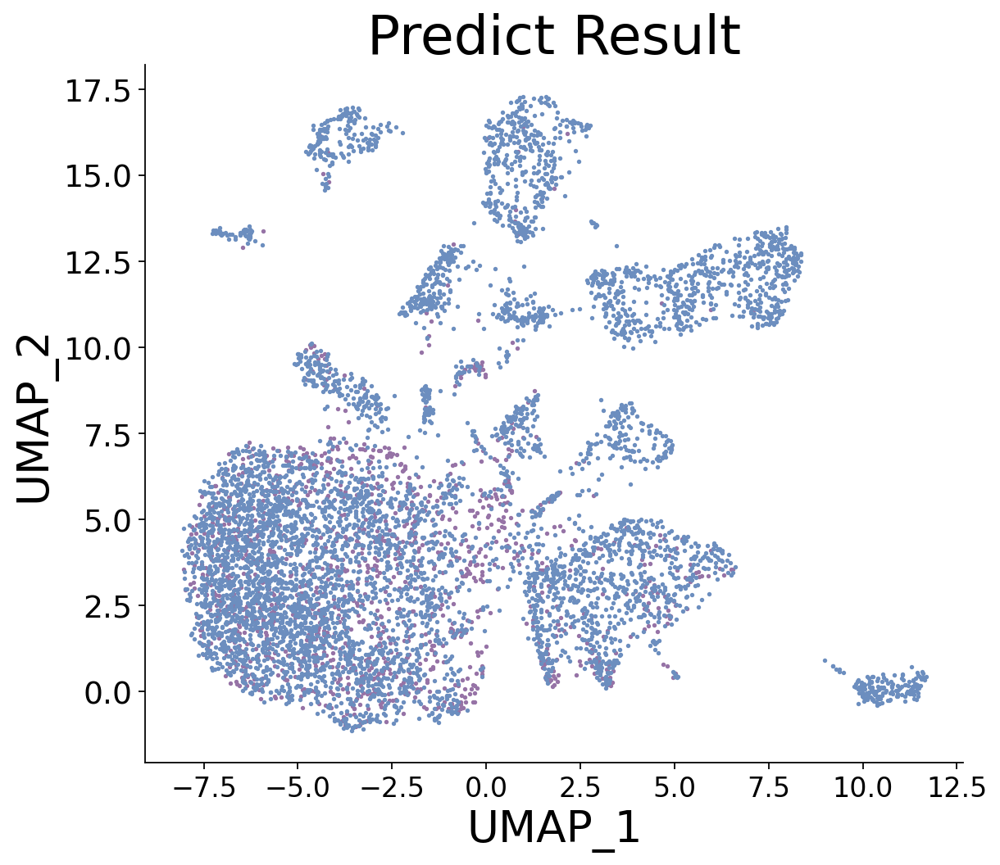

YS2306057_BD_230615
... reading from cache file cache/..-..-Shanyr-liver-data-YS2306057_BD_230615-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 8913 × 36601
    var: 'gene_ids', 'feature_types'
filtered out 13083 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:45)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:37)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:30)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished

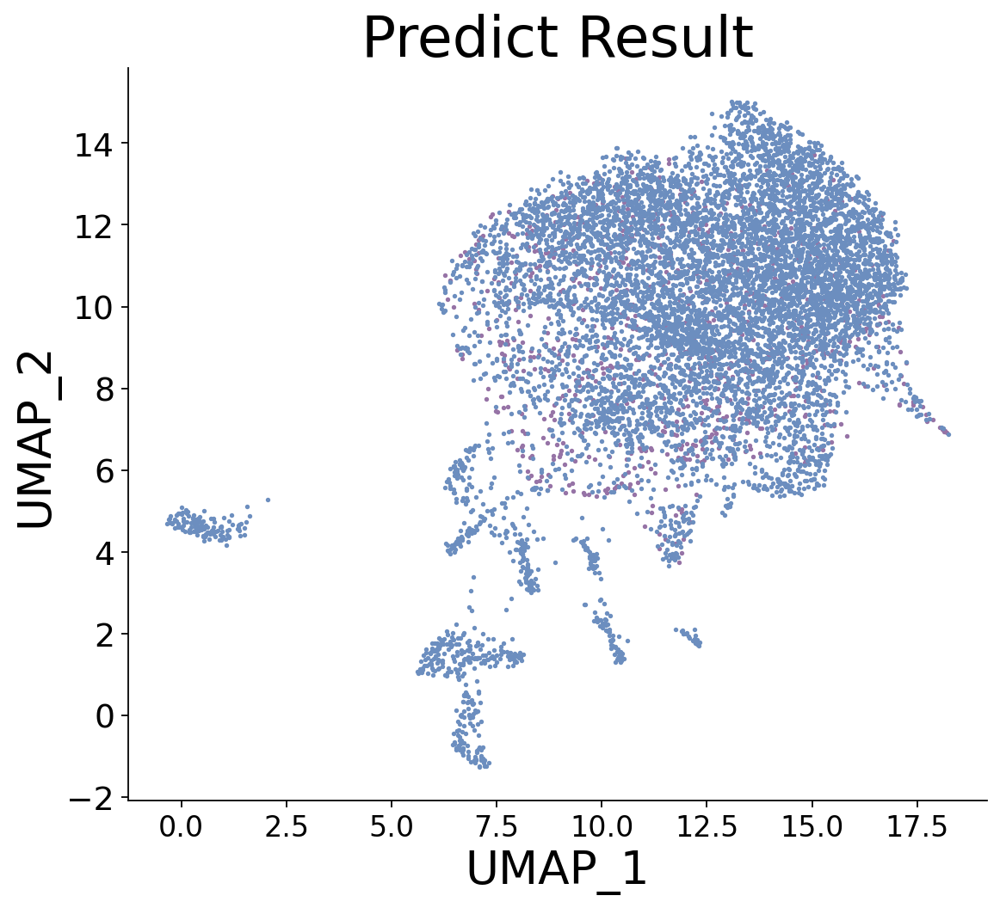

YS2306057_NL_230615
... reading from cache file cache/..-..-Shanyr-liver-data-YS2306057_NL_230615-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 9996 × 36601
    var: 'gene_ids', 'feature_types'
filtered out 13662 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:53)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:44)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:39)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished

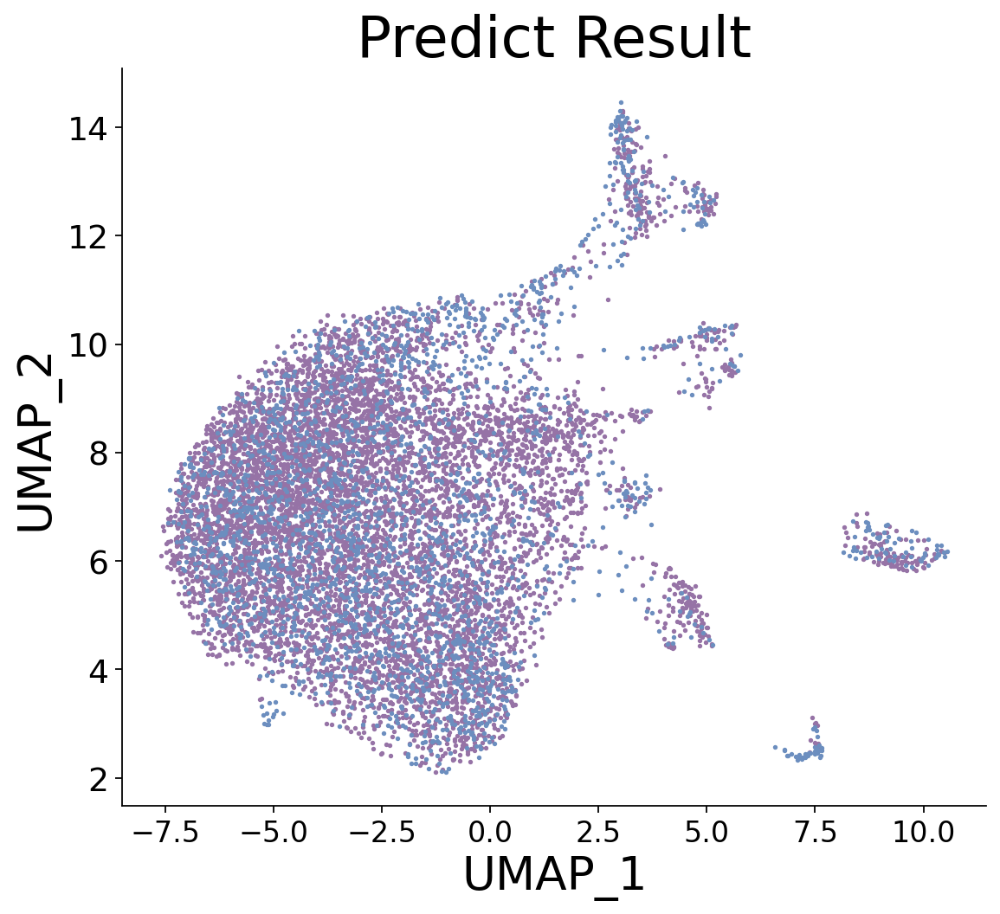

YS2306060_AV_230615
... reading from cache file cache/..-..-Shanyr-liver-data-YS2306060_AV_230615-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 8912 × 36601
    var: 'gene_ids', 'feature_types'
filtered out 13403 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:41)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:30)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:20)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished

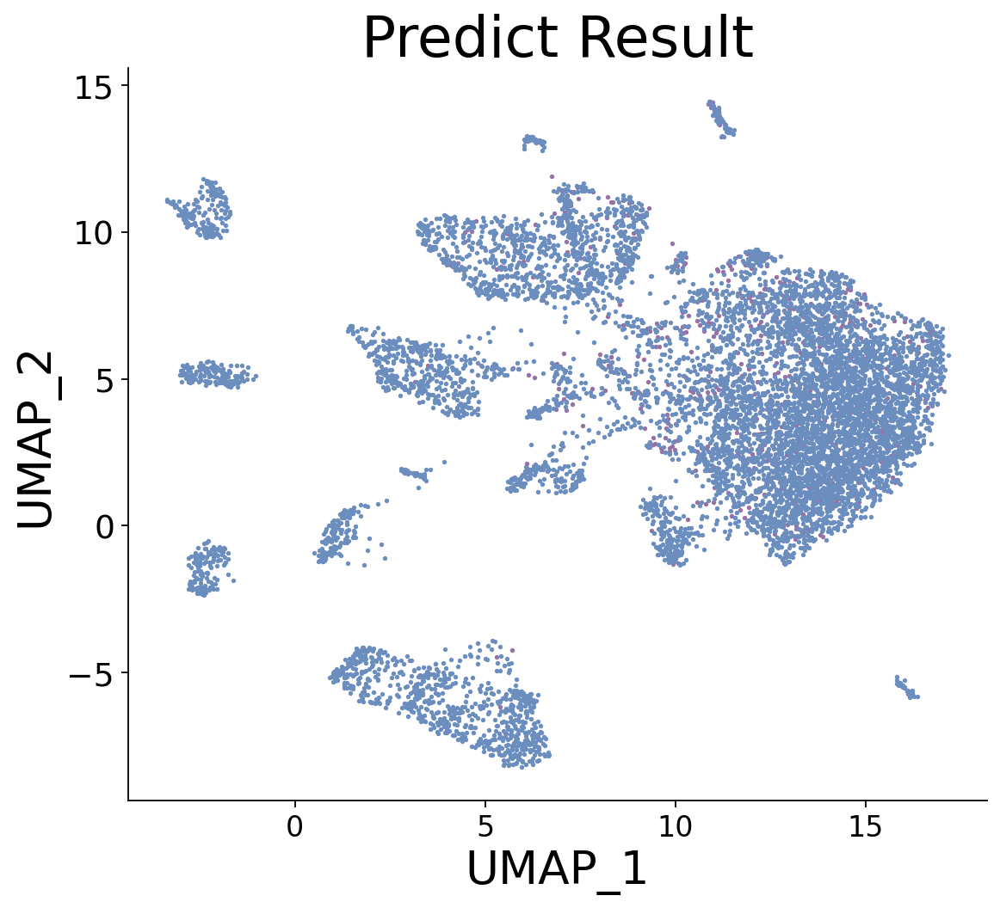

YS2306060_NL_230615
... reading from cache file cache/..-..-Shanyr-liver-data-YS2306060_NL_230615-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 11185 × 36601
    var: 'gene_ids', 'feature_types'
filtered out 15118 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:03:08)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:02:06)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:03:05)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finishe

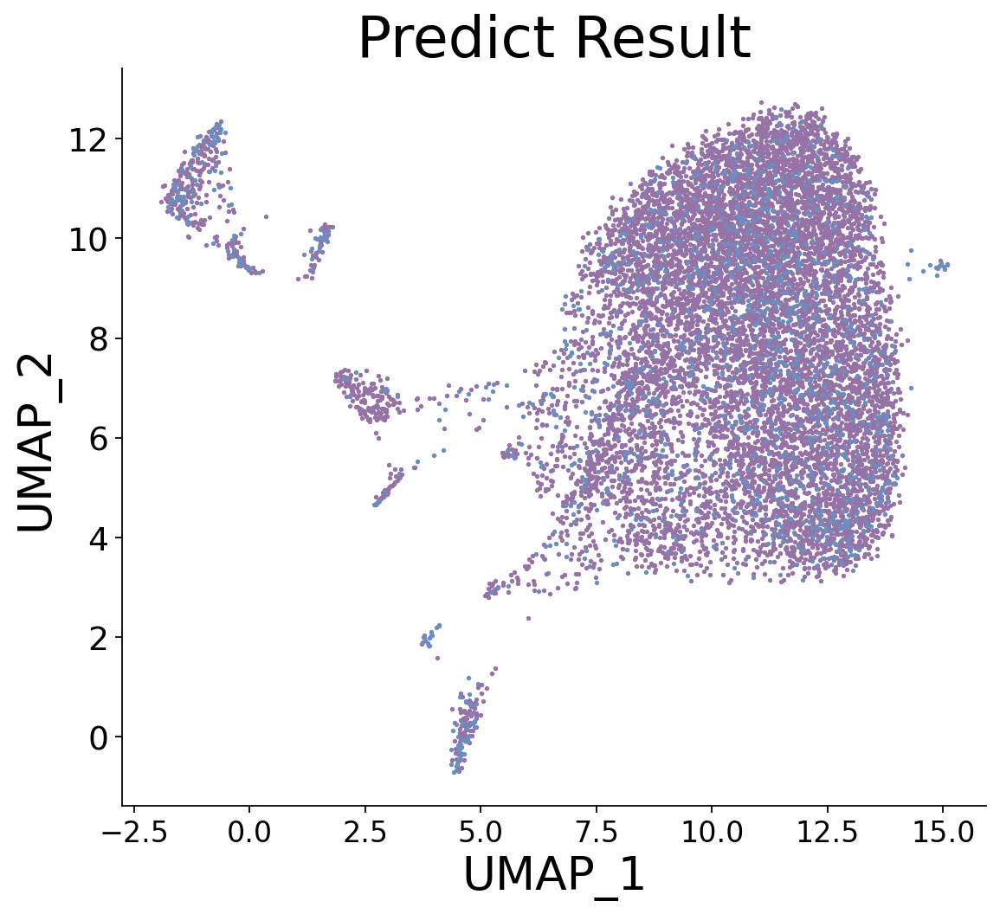

In [26]:
# Samples selected
names = ['YS2306057_AV_230615', 'YS2306057_BD_230615', 'YS2306057_NL_230615', 'YS2306060_AV_230615', 'YS2306060_NL_230615']
for name in names:
    print(name)
    path = '../../Shanyr/liver/data/' + name
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=True)
    print(data)
    # h5ad files
    # data = sc.read_h5ad('../../lxq/PDAC/dynamics/PDAC/P4_seurat2scanpy.h5ad')
    # data = sc.read_h5ad('./CHOL/malig_choose.h5ad')

    data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
    # sc.pp.filter_cells(data, min_genes=200)
    sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
    mito_genes = data.var_names.str.startswith('MT-')
    data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
    data.obs['n_counts'] = data.X.sum(axis=1).A1
    mitoThres = 0.15
    # data = data[data.obs.percent_mito < mitoThres, :]
    # 标准化:TPM
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
    print("finish regressing...!!!")
    # 整理数据
    cntMatrix = sparse.csr_matrix(data.X).todense()
    cellName = np.array(data.obs.index)
    for i in range(len(cellName)):
        newName = cellName[i].split('-')[0]
        cellName[i] = newName
    arr = pd.DataFrame(data=cntMatrix, index=cellName, columns=data.var.index)
    # 选择基因
    # selectGene = np.loadtxt('./txtData/selectGenesByVar-all.txt', dtype=str)
    selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)['0']
    # selectGene = np.array(selectGene).tolist()[0]
    # arr = arr.loc[:,selectGene]
    
    # 这里是为了防止预测数据集里的基因没有在之前的步骤中被选中，或者选中的基因在预测集里没有
    pred_mtx = pd.DataFrame(np.zeros((arr.shape[0], len(selectGene))))
    genes = data.var.index
    lostGene = []
    cnt = 0
    for i in range(len(selectGene)):
        if selectGene[i] in genes:
            loc = np.where(genes == selectGene[i])
            j = loc[0][0]
            pred_mtx.iloc[:,i] = arr.iloc[:,j].values
        else:
            lostGene.append(selectGene[i])
            cnt += 1
    sc.tl.tsne(data)
    sc.pp.neighbors(data)
    sc.tl.umap(data)
    print("finish umap...!!!")
    # path = './SingleCell/' + predictSample
    # cellAnn = pd.read_csv(path+'/cellAnnotation.txt', delim_whitespace=True, 
    #                     usecols=['barcodes','tSNE_1','tSNE_2'], index_col=['barcodes'])
    # decomp_data = pd.merge(arr, cellAnn, how='inner', left_index=True, right_index=True)
    # predict = reg.predict(decomp_data.iloc[:,:-2])
    # decomp_data = decomp_data.loc[:,['tSNE_1','tSNE_2']]
    THRESHOLD = 0.5
    predictSample = name
    predict = reg.predict(pred_mtx)
    # predict = reg.predict(arr)
    predict = predict > THRESHOLD
    # decomp_data = data.obsm['X_tsne']
    decomp_data = data.obsm['X_umap']
    pred_true_idx  = predict == 1
    pred_false_idx = predict == 0

    ALPHA = 1
    S = 2
    path = './Predict/'
    plt.figure(1,figsize=(8,7))
    plt.grid(b=False)
    plt.scatter(x=decomp_data[pred_true_idx,0] ,y=decomp_data[pred_true_idx,1] ,c='#9673A6',s=S,label='Malignant',alpha=ALPHA)
    plt.scatter(x=decomp_data[pred_false_idx,0],y=decomp_data[pred_false_idx,1],c='#6C8EBF',s=S,label='nonMalignant',alpha=ALPHA)
    # plt.legend(loc='upper left', fontsize = 15)
    # plt.xlabel('tSNE_1')
    # plt.ylabel('tSNE_2')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=17)
    plt.xlabel('UMAP_1', fontsize=24)
    plt.ylabel('UMAP_2', fontsize=24)
    plt.title('Predict Result', fontsize=30)
        
    ax = plt.gca()
    ax.spines.right.set_color('none')
    ax.spines['top'].set_visible(False)
    
    plt.savefig(path+predictSample+'.jpg', dpi=100)
    plt.show()

# Genes

In [62]:
# 选择基因
# selectGene = np.loadtxt('./txtData/selectGenesByVar-all.txt', dtype=str)
selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-union.txt', sep='\t')
# selectGene = np.array(selectGene).tolist()[0]
arr.loc[:,np.intersect1d(arr.columns, selectGene)]

,A1BG,AAAS,AAGAB,AAK1,AAMP,ABCF1,ABHD11,ABHD3,ABI1,ABRACL,...,ZNF638,ZNF692,ZNF706,ZNF74,ZNF768,ZNHIT1,ZNHIT2,ZNRD1,ZRANB2,ZYX
AAACCCACACTCAAGT,1.099705,-0.050151,-0.077557,-0.821650,-0.134670,0.952447,-0.039397,-0.172739,-0.374847,-0.574651,...,0.781365,-0.052750,-0.509203,-0.019284,-0.004367,-0.339121,-0.036704,-0.312266,0.422764,-0.226813
AAACCCATCGTGGAAG,-0.208903,-0.072975,-0.091048,-0.797787,-0.193536,-0.461694,-0.053423,-0.200485,-0.466284,-0.896072,...,0.873449,-0.053280,-0.011577,-0.016166,-0.009696,0.210068,-0.042625,0.226567,-0.863633,0.714492
AAACGAACATAGAATG,-0.187522,-0.056880,-0.098007,0.743611,-0.165385,-0.375182,-0.047295,-0.204113,-0.436115,0.706060,...,-0.515717,-0.057573,-0.591437,-0.023490,-0.006755,0.561884,-0.040860,0.597319,-0.799758,-0.346901
AAACGAAGTCTTCTAT,-0.169874,-0.043535,-0.067864,-0.837345,-0.112919,-0.283284,-0.034011,-0.156555,-0.336301,-0.426114,...,-0.489694,-0.050959,1.302726,-0.018389,-0.002536,-0.266580,-0.034142,-0.240806,-0.873669,-0.157347
AAACGCTCACATGACT,-0.188028,-0.057245,-0.088318,1.469914,-0.158292,-0.371789,-0.045257,-0.190610,-0.416946,-0.737442,...,0.996224,-0.054775,-0.578220,-0.020358,-0.006349,1.082389,-0.039505,0.618674,0.666520,1.198384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTTCTAAGC,-0.165657,-0.040368,-0.073908,-0.828639,-0.111171,-0.268888,-0.033873,-0.163851,-0.340101,-0.457318,...,-0.497643,-0.053127,-0.432346,-0.021284,-0.002189,-0.293100,-0.034479,2.026332,-0.844588,2.112677
TTTGTTGTCCCTCGTA,-0.177397,-0.049232,-0.085528,-0.809685,-0.139205,-0.325207,-0.040777,-0.183610,-0.388899,-0.643240,...,-0.505936,-0.055141,0.835183,-0.022058,-0.004575,-0.382457,-0.037712,1.001602,1.080037,-0.260648
TTTGTTGTCCCTGTTG,-0.163580,-0.038795,-0.069010,-0.836307,-0.103896,-0.257300,-0.032001,-0.156352,-0.325535,-0.397170,...,-0.493136,-0.051967,-0.412932,-0.020264,-0.001625,-0.260987,-0.033491,-0.230276,-0.858051,-0.145336
TTTGTTGTCGATTCCC,-0.168938,-0.042845,-0.076435,1.055407,-0.118419,1.595625,-0.035638,-0.168358,-0.352236,-0.502373,...,1.380652,-0.053486,-0.454425,-0.021276,-0.002820,-0.313941,-0.035277,-0.281514,-0.841704,-0.194818


In [59]:
selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-union.txt', sep='\t', index_col=0)
selectGene

,X.TRIP13.,X.ALG3.,X.ARFGAP1.,X.BIRC5.,X.CDKN2A.,X.CDKN3.,X.CENPF.,X.DAZAP1.,X.DDX39A.,X.FKBP4.,...,X.ARID5A.,X.SERPING1.,X.MTCH2.,X.AKR7A2.,X.NECAP2.,X.TBCC.,X.XRN1.,X.AKR1C3.,X.ZMYM2.,X.TMED5.
1,TRIP13,ALG3,ARFGAP1,BIRC5,CDKN2A,CDKN3,CENPF,DAZAP1,DDX39A,FKBP4,...,ARID5A,SERPING1,MTCH2,AKR7A2,NECAP2,TBCC,XRN1,AKR1C3,ZMYM2,TMED5


In [75]:
temp = np.intersect1d(arr.columns, selectGene).tolist()
temp_df = pd.DataFrame(temp)
temp_df

,0
0,A1BG
1,AAAS
2,AAGAB
3,AAK1
4,AAMP
...,...
2751,ZNHIT1
2752,ZNHIT2
2753,ZNRD1
2754,ZRANB2


In [77]:
temp_df.to_csv("./txtData/genes-scRNA-tcga-sorted.txt", sep='\t')

# 10X samples-bimodal CNV score / Normal

./SingleCell/20180625-HCC-P4-Tumor-New
... reading from cache file cache/SingleCell-20180625-HCC-P4-Tumor-New-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 3592 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 85 cells that have less than 200 genes expressed
filtered out 15305 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:42)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:25)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:08)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
finish umap...!!!


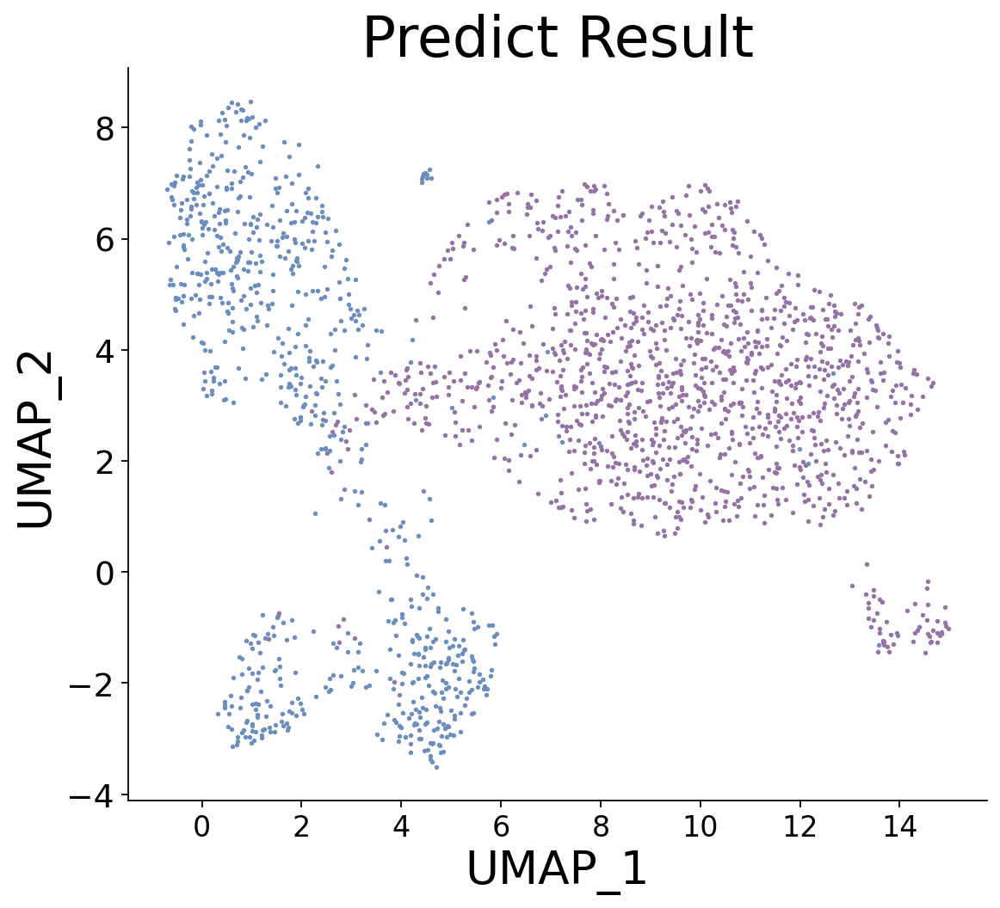

./SingleCell/20181024-KC-P7-Tumor-vCR3
... reading from cache file cache/SingleCell-20181024-KC-P7-Tumor-vCR3-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 12141 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 22 cells that have less than 200 genes expressed
filtered out 13586 genes that are detected in less than 3 cells


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:38)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:11)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:14)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
finish umap...!!!


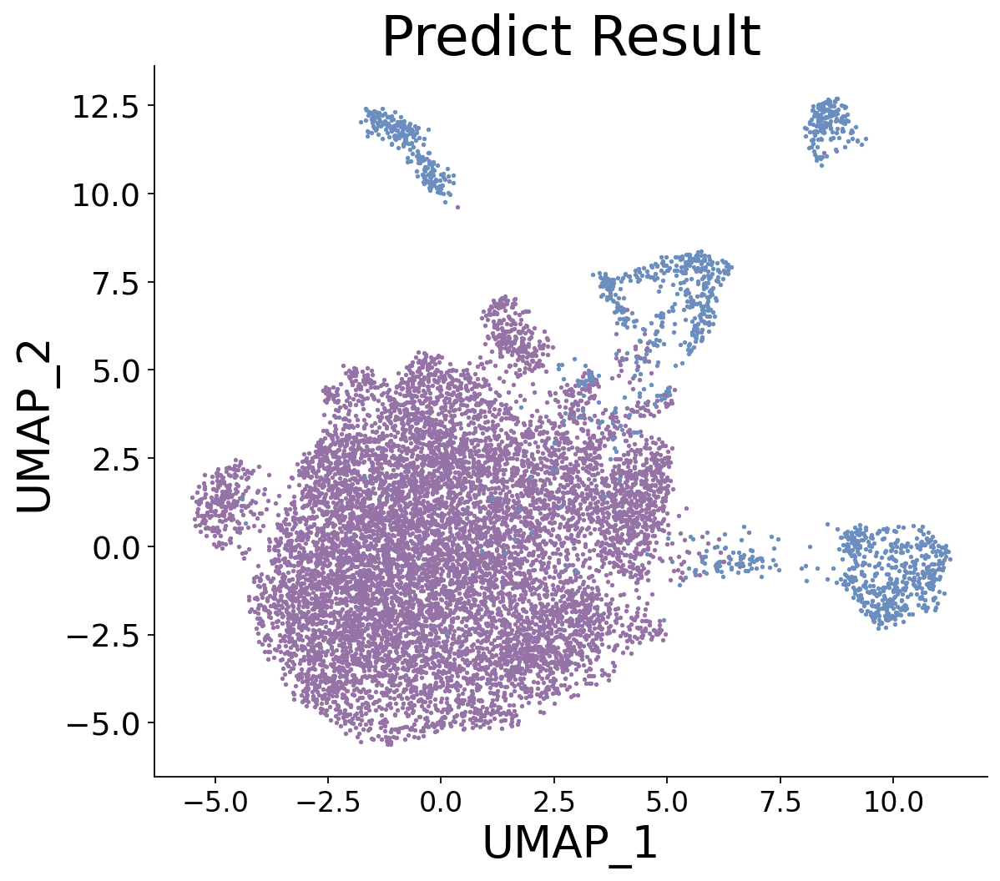

./SingleCell/20200208-PAC-CRR034517-T22-Tumor
... reading from cache file cache/SingleCell-20200208-PAC-CRR034517-T22-Tumor-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 5253 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 29 cells that have less than 200 genes expressed
filtered out 13747 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:01:15)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:33)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:18)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
finish umap...!!!


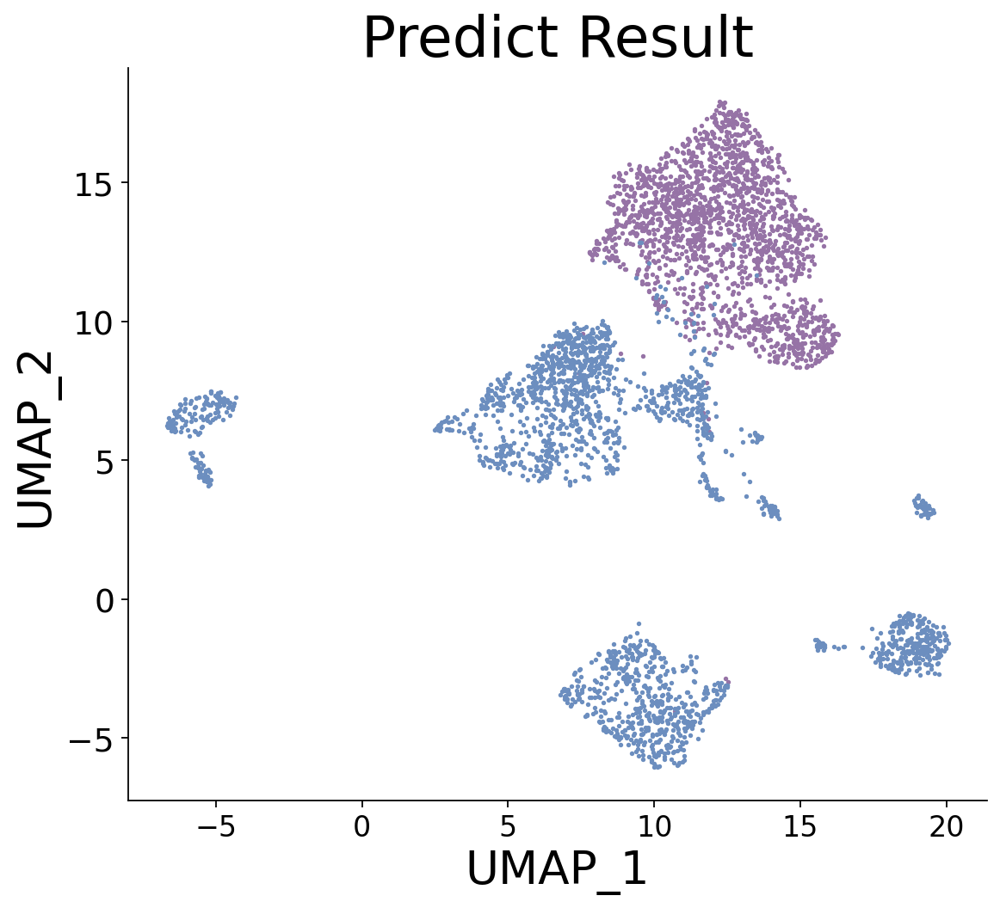

./SingleCell/20200215-HCC-Pt14b-Tumor
... reading from cache file cache/SingleCell-20200215-HCC-Pt14b-Tumor-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 15687 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 2 cells that have less than 200 genes expressed
filtered out 13010 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:29)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:58)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:47)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
finish umap...!!!


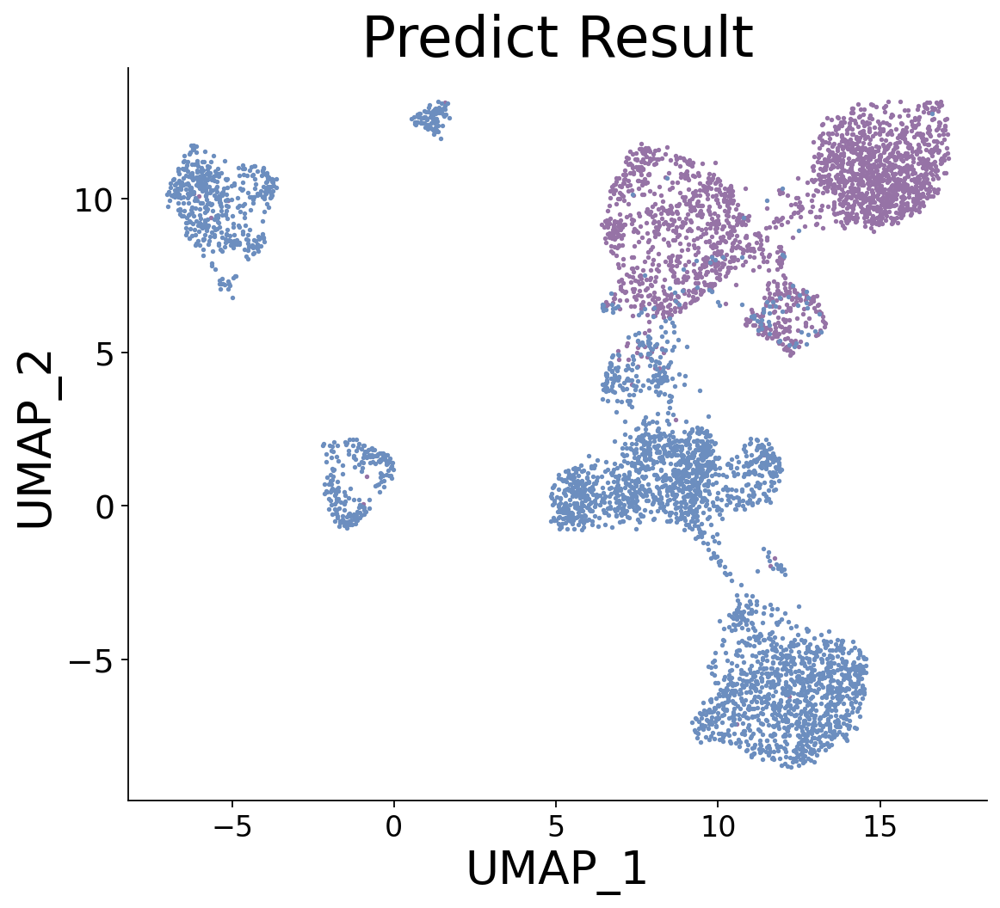

./SingleCell/20190913-HCC-P8-Normal
... reading from cache file cache/SingleCell-20190913-HCC-P8-Normal-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 7544 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 25 cells that have less than 200 genes expressed
filtered out 14866 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:17)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:45)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:33)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
finish umap...!!!


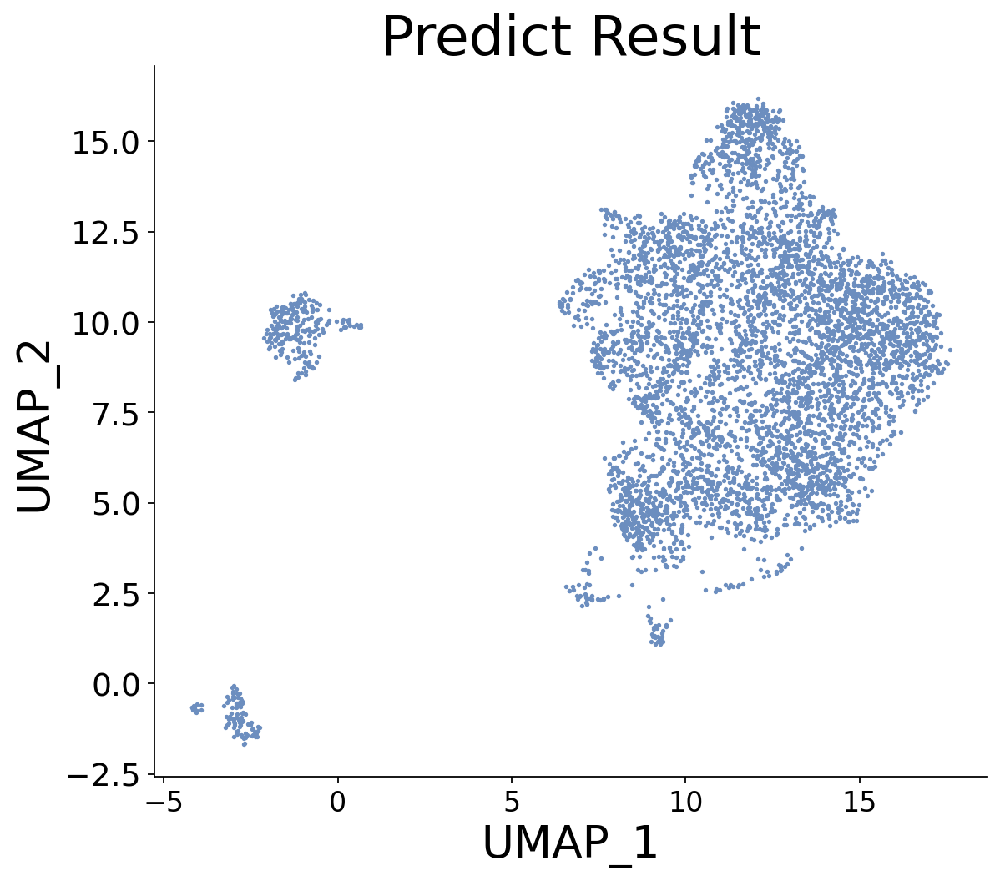

./SingleCell/20200208-PAC-CRR034530-N11-Normal
... reading from cache file cache/SingleCell-20200208-PAC-CRR034530-N11-Normal-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 10553 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 154 cells that have less than 200 genes expressed
filtered out 13888 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:01:17)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:47)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:33)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
finish umap...!!!


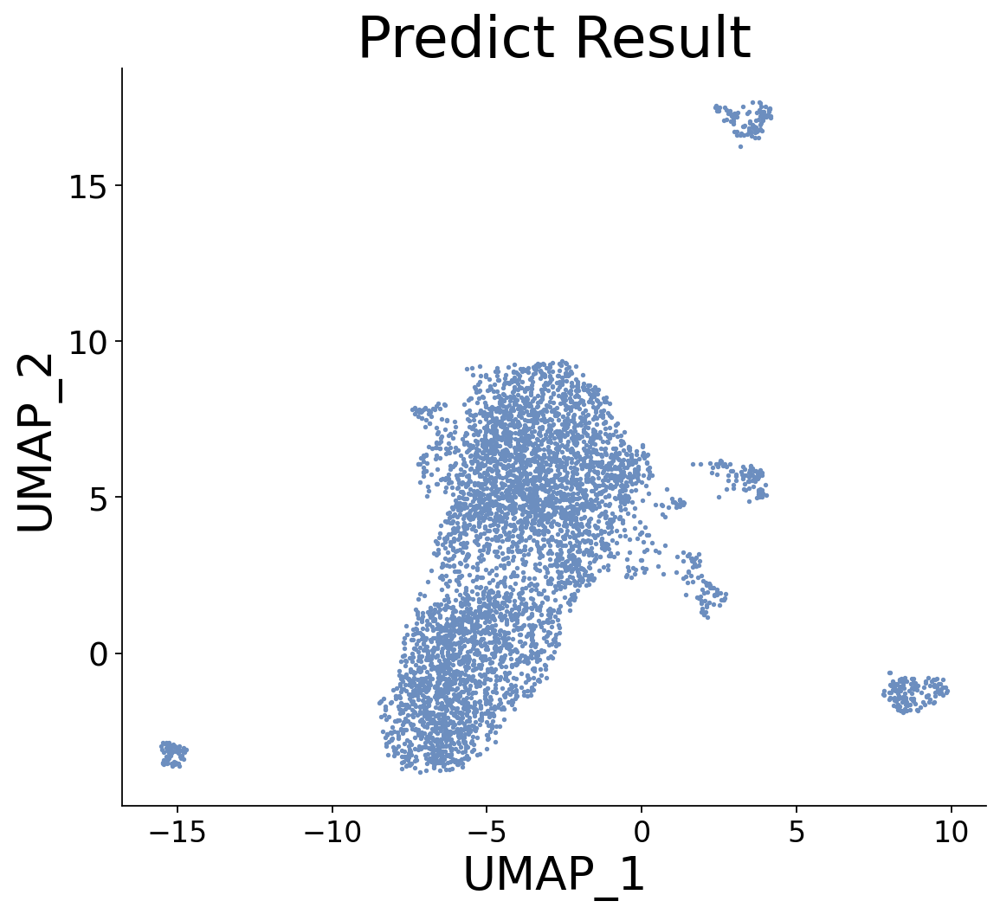

./SingleCell/20200208-PAC-CRR034523-N4-Normal
... reading from cache file cache/SingleCell-20200208-PAC-CRR034523-N4-Normal-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 7766 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 17 cells that have less than 200 genes expressed
filtered out 13626 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:01:01)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:29)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:12)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
finish umap...!!!


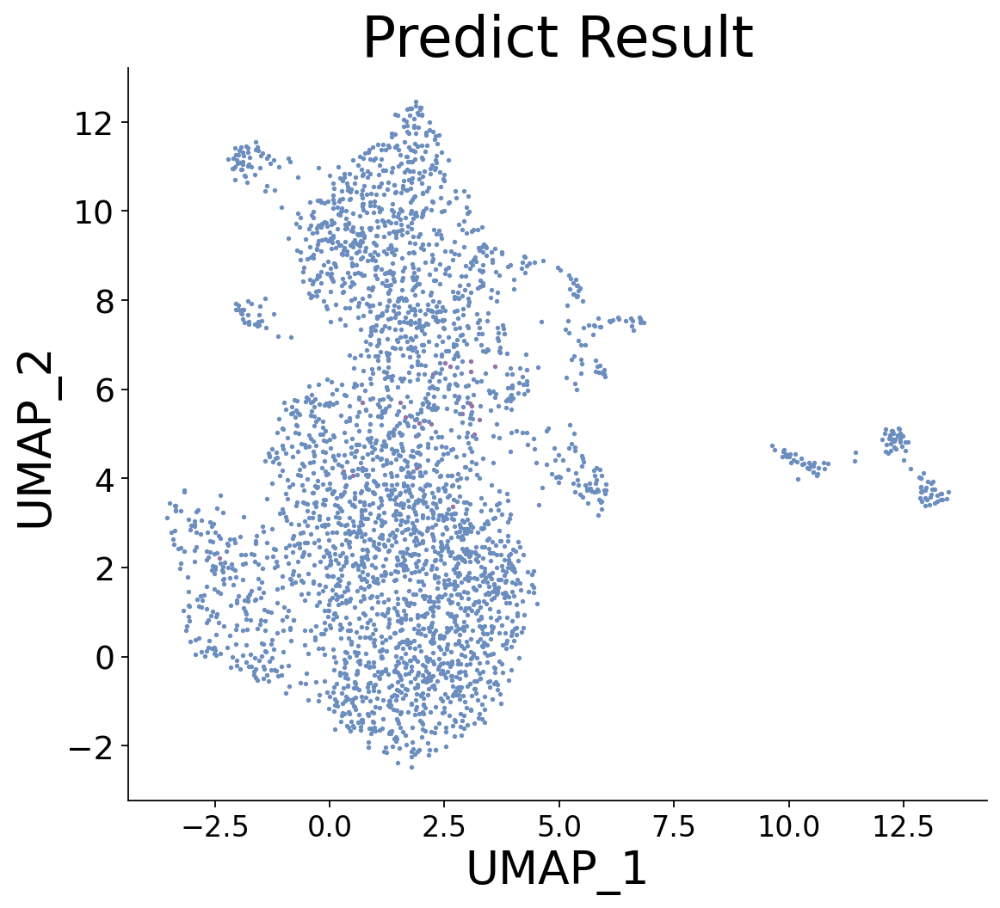

./SingleCell/20200208-PAC-CRR034524-N5-Normal
... reading from cache file cache/SingleCell-20200208-PAC-CRR034524-N5-Normal-filtered_feature_bc_matrix-matrix.h5ad
AnnData object with n_obs × n_vars = 4034 × 32738
    var: 'gene_ids', 'feature_types'
filtered out 6 cells that have less than 200 genes expressed
filtered out 15646 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/glab/wguo/softwares/anaconda3/envs/rtest4-3/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:47)
finish regressing...!!!
computing tSNE
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:22)
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
finish umap...!!!


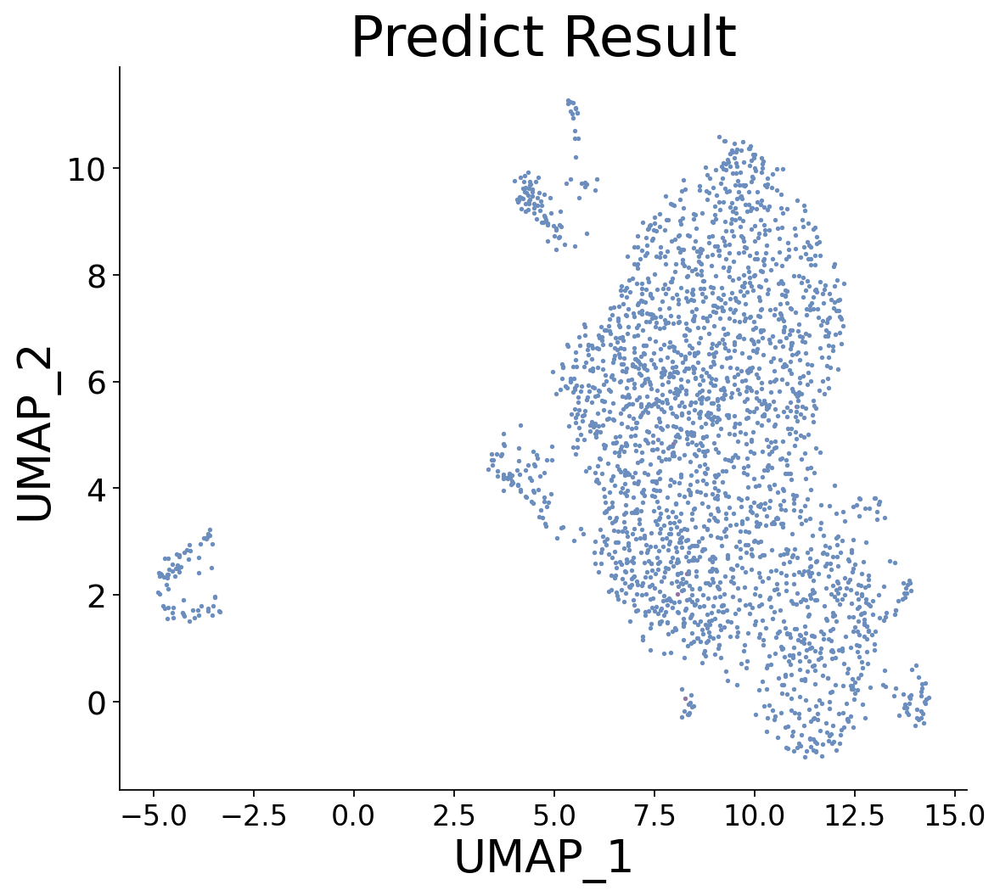

In [25]:
# Tumor & Normal samples
names = ['20180625-HCC-P4-Tumor-New', '20181024-KC-P7-Tumor-vCR3', '20200208-PAC-CRR034517-T22-Tumor', '20200215-HCC-Pt14b-Tumor',
         '20190913-HCC-P8-Normal', '20200208-PAC-CRR034530-N11-Normal', '20200208-PAC-CRR034523-N4-Normal', '20200208-PAC-CRR034524-N5-Normal']
for name in names:
    path = './SingleCell/' + name
    print(path)
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=True)
    print(data)
    # h5ad files
    # data = sc.read_h5ad('../../lxq/PDAC/dynamics/PDAC/P4_seurat2scanpy.h5ad')
    # data = sc.read_h5ad('./CHOL/malig_choose.h5ad')

    data.var_names_make_unique()
    # 基础过滤:去除表达基因200以下的细胞, 去除在3个细胞以下表达的基因。
    sc.pp.filter_cells(data, min_genes=200)
    sc.pp.filter_genes(data, min_cells=3)
    # 过滤线粒体基因比例 > 15% 的细胞
    mito_genes = data.var_names.str.startswith('MT-')
    data.obs['percent_mito'] = np.sum(data[:,mito_genes].X,axis=1).A1 / np.sum(data.X,axis=1).A1
    data.obs['n_counts'] = data.X.sum(axis=1).A1
    mitoThres = 0.15
    data = data[data.obs.percent_mito < mitoThres, :]
    # 标准化:TPM
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.regress_out(data, ['n_counts', 'percent_mito']) # 校正细胞基因计数和线粒体基因比例的影响。
    print("finish regressing...!!!")
    # 整理数据
    cntMatrix = sparse.csr_matrix(data.X).todense()
    cellName = np.array(data.obs.index)
    for i in range(len(cellName)):
        newName = cellName[i].split('-')[0]
        cellName[i] = newName
    arr = pd.DataFrame(data=cntMatrix, index=cellName, columns=data.var.index)
    # 选择基因
    # selectGene = np.loadtxt('./txtData/selectGenesByVar-all.txt', dtype=str)
    # selectGene = np.array(selectGene).tolist()[0]
    # arr = arr.loc[:,selectGene]
    
    selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)['0']
    # arr = arr.loc[:,selectGene['0']]
    
    # selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-intersect.txt', sep='\t', index_col=0)
    # arr = arr.loc[:,selectGene['x']]
    
    # 这里是为了防止预测数据集里的基因没有在之前的步骤中被选中，或者选中的基因在预测集里没有
    pred_mtx = pd.DataFrame(np.zeros((arr.shape[0], len(selectGene))))
    genes = data.var.index
    lostGene = []
    cnt = 0
    for i in range(len(selectGene)):
        if selectGene[i] in genes:
            loc = np.where(genes == selectGene[i])
            j = loc[0][0]
            pred_mtx.iloc[:,i] = arr.iloc[:,j].values
        else:
            lostGene.append(selectGene[i])
            cnt += 1
    
    sc.tl.tsne(data)
    sc.pp.neighbors(data)
    sc.tl.umap(data)
    # path = './SingleCell/' + predictSample
    # cellAnn = pd.read_csv(path+'/cellAnnotation.txt', delim_whitespace=True, 
    #                     usecols=['barcodes','tSNE_1','tSNE_2'], index_col=['barcodes'])
    # decomp_data = pd.merge(arr, cellAnn, how='inner', left_index=True, right_index=True)
    # predict = reg.predict(decomp_data.iloc[:,:-2])
    # decomp_data = decomp_data.loc[:,['tSNE_1','tSNE_2']]
    print("finish umap...!!!")
    THRESHOLD = 0.5
    predictSample = name
    # predict = reg.predict(arr)
    predict = reg.predict(pred_mtx)
    predict = predict > THRESHOLD
    # decomp_data = data.obsm['X_tsne']
    decomp_data = data.obsm['X_umap']
    pred_true_idx  = predict == 1
    pred_false_idx = predict == 0

    ALPHA = 1
    S = 2
    path = './Predict/'
    plt.figure(1,figsize=(8,7))
    plt.grid(b=False)
    plt.scatter(x=decomp_data[pred_true_idx,0] ,y=decomp_data[pred_true_idx,1] ,c='#9673A6',s=S,label='Malignant',alpha=ALPHA)
    plt.scatter(x=decomp_data[pred_false_idx,0],y=decomp_data[pred_false_idx,1],c='#6C8EBF',s=S,label='nonMalignant',alpha=ALPHA)
    # plt.legend(loc='upper left', fontsize = 15)
    # plt.xlabel('tSNE_1')
    # plt.ylabel('tSNE_2')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=17)
    plt.xlabel('UMAP_1', fontsize=24)
    plt.ylabel('UMAP_2', fontsize=24)
    plt.title('Predict Result', fontsize=30)
        
    ax = plt.gca()
    ax.spines.right.set_color('none')
    ax.spines['top'].set_visible(False)
    plt.savefig(path+predictSample+'.jpg', dpi=100)
    plt.show()

In [91]:
selectGene = pd.read_csv('./txtData/genes-scRNA-tcga-sorted.txt', sep='\t', index_col=0)
arr.loc[:,selectGene['0']]

,A1BG,AAAS,AAGAB,AAK1,AAMP,ABCF1,ABHD11,ABHD3,ABI1,ABRACL,...,ZNF638,ZNF692,ZNF706,ZNF74,ZNF768,ZNHIT1,ZNHIT2,ZNRD1,ZRANB2,ZYX
AAACCCACACTCAAGT,1.099705,-0.050151,-0.077557,-0.821650,-0.134670,0.952447,-0.039397,-0.172739,-0.374847,-0.574651,...,0.781365,-0.052750,-0.509203,-0.019284,-0.004367,-0.339121,-0.036704,-0.312266,0.422764,-0.226813
AAACCCATCGTGGAAG,-0.208903,-0.072975,-0.091048,-0.797787,-0.193536,-0.461694,-0.053423,-0.200485,-0.466284,-0.896072,...,0.873449,-0.053280,-0.011577,-0.016166,-0.009696,0.210068,-0.042625,0.226567,-0.863633,0.714492
AAACGAACATAGAATG,-0.187522,-0.056880,-0.098007,0.743611,-0.165385,-0.375182,-0.047295,-0.204113,-0.436115,0.706060,...,-0.515717,-0.057573,-0.591437,-0.023490,-0.006755,0.561884,-0.040860,0.597319,-0.799758,-0.346901
AAACGAAGTCTTCTAT,-0.169874,-0.043535,-0.067864,-0.837345,-0.112919,-0.283284,-0.034011,-0.156555,-0.336301,-0.426114,...,-0.489694,-0.050959,1.302726,-0.018389,-0.002536,-0.266580,-0.034142,-0.240806,-0.873669,-0.157347
AAACGCTCACATGACT,-0.188028,-0.057245,-0.088318,1.469914,-0.158292,-0.371789,-0.045257,-0.190610,-0.416946,-0.737442,...,0.996224,-0.054775,-0.578220,-0.020358,-0.006349,1.082389,-0.039505,0.618674,0.666520,1.198384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTTCTAAGC,-0.165657,-0.040368,-0.073908,-0.828639,-0.111171,-0.268888,-0.033873,-0.163851,-0.340101,-0.457318,...,-0.497643,-0.053127,-0.432346,-0.021284,-0.002189,-0.293100,-0.034479,2.026332,-0.844588,2.112677
TTTGTTGTCCCTCGTA,-0.177397,-0.049232,-0.085528,-0.809685,-0.139205,-0.325207,-0.040777,-0.183610,-0.388899,-0.643240,...,-0.505936,-0.055141,0.835183,-0.022058,-0.004575,-0.382457,-0.037712,1.001602,1.080037,-0.260648
TTTGTTGTCCCTGTTG,-0.163580,-0.038795,-0.069010,-0.836307,-0.103896,-0.257300,-0.032001,-0.156352,-0.325535,-0.397170,...,-0.493136,-0.051967,-0.412932,-0.020264,-0.001625,-0.260987,-0.033491,-0.230276,-0.858051,-0.145336
TTTGTTGTCGATTCCC,-0.168938,-0.042845,-0.076435,1.055407,-0.118419,1.595625,-0.035638,-0.168358,-0.352236,-0.502373,...,1.380652,-0.053486,-0.454425,-0.021276,-0.002820,-0.313941,-0.035277,-0.281514,-0.841704,-0.194818


# Count number of cells

In [8]:
names = ['20200208-PAC-CRR034523-N4-Normal', '20200208-PAC-CRR034524-N5-Normal',
         '20200217-LUAD-LX653-Tumor', '20200208-PAC-CRR034496-T1-Tumor', '20200215-HCC-Pt13c-Tumor',
         '20200217-LUAD-LX684-Tumor', '20200215-HCC-Pt14d-Tumor','20200208-PAC-CRR034505-T10-Tumor']
count1 = 0
for name in names:
    path = './SingleCell/' + name
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=True)
    print(data.n_obs)
    count1 = count1 + data.n_obs
print(count1)

... reading from cache file cache/SingleCell-20200208-PAC-CRR034523-N4-Normal-filtered_feature_bc_matrix-matrix.h5ad
7766
... reading from cache file cache/SingleCell-20200208-PAC-CRR034524-N5-Normal-filtered_feature_bc_matrix-matrix.h5ad
4034
... reading from cache file cache/SingleCell-20200217-LUAD-LX653-Tumor-filtered_feature_bc_matrix-matrix.h5ad
2271
... reading from cache file cache/SingleCell-20200208-PAC-CRR034496-T1-Tumor-filtered_feature_bc_matrix-matrix.h5ad
2538
... reading from cache file cache/SingleCell-20200215-HCC-Pt13c-Tumor-filtered_feature_bc_matrix-matrix.h5ad
14486
... reading from cache file cache/SingleCell-20200217-LUAD-LX684-Tumor-filtered_feature_bc_matrix-matrix.h5ad
3879
... reading from cache file cache/SingleCell-20200215-HCC-Pt14d-Tumor-filtered_feature_bc_matrix-matrix.h5ad
26530
... reading from cache file cache/SingleCell-20200208-PAC-CRR034505-T10-Tumor-filtered_feature_bc_matrix-matrix.h5ad
1799
63303


In [7]:
names = ['cc001', 'cc002', 'cc003', 'cc006', 'CC009', 'icc010']
count2 = 0
for name in names:
    print(name)
    path = '../../Shanyr/data/cellranger/' + name + '/outs/'
    data = sc.read_10x_mtx(path+'/filtered_feature_bc_matrix', var_names='gene_symbols', cache=True)
    print(data.n_obs)
    count2 = count2 + data.n_obs
print(count2)

cc001
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc001-outs-filtered_feature_bc_matrix-matrix.h5ad
9331
cc002
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc002-outs-filtered_feature_bc_matrix-matrix.h5ad
16544
cc003
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc003-outs-filtered_feature_bc_matrix-matrix.h5ad
6982
cc006
... reading from cache file cache/..-..-Shanyr-data-cellranger-cc006-outs-filtered_feature_bc_matrix-matrix.h5ad
16616
CC009
... reading from cache file cache/..-..-Shanyr-data-cellranger-CC009-outs-filtered_feature_bc_matrix-matrix.h5ad
9638
icc010
... reading from cache file cache/..-..-Shanyr-data-cellranger-icc010-outs-filtered_feature_bc_matrix-matrix.h5ad
5748
64859


In [10]:
466468 + 63303 + 64859

594630